<a href="https://colab.research.google.com/github/Ali-sobhy1/Andys_YouTube_Notebooks/blob/main/Copy_of_Optimization_of_Rate_of_Penetration_ROP_depending_on_surface_and_downhole_data_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Optimization of Rate of Penetration ROP depending on surface and downhole data.

In the drilling industry, the rate of penetration (ROP), also known as penetration rate or drill rate, is the speed at which a drill bit breaks the rock under it to deepen the borehole. It is normally measured in feet per minute or meters per hour, but sometimes it is expressed in minutes per foot.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


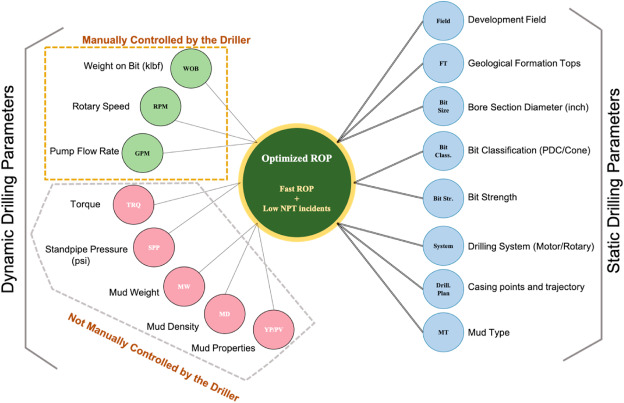

This notebook focuses on optimizing the Rate of Penetration (ROP) in drilling operations by leveraging a dataset from surface and downhole sensors. The objective is to identify optimal drilling parameters that maximize ROP while ensuring borehole integrity.

### Mechanical Specific Energy (MSE) Analysis

A key focus is the analysis of Mechanical Specific Energy (MSE) trends. MSE quantifies the energy required per unit volume of rock removed. Low MSE indicates efficient drilling, while high MSE suggests energy inefficiency due to vibrations, bit balling, or friction. The goal is to determine parameters that facilitate the fastest drilling without equipment damage.

### Dataset Overview

The dataset comprises eight critical drilling parameters:

*   **Hole Depth**: Provides vertical context, influencing rock compaction and strength.
*   **Hook Load**: Monitors drill string weight, indicating potential sticking or excessive drag.
*   **Rotary RPM & Torque**: Represents rotational energy and the rock's resistance, respectively.
*   **Weight on Bit (WOB)**: The applied downward force, crucial for effective rock cutting.
*   **Differential Pressure**: Reflects downhole motor performance and drilling fluid efficiency.
*   **Gamma at Bit**: A geological indicator for lithology (e.g., shale vs. sandstone), guiding parameter adjustments.
*   **Rate Of Penetration (ROP)**: The primary target variable, measuring drilling speed.

### Methodology

The analytical workflow involves a structured engineering pipeline:

1.  **Data Hygiene & Cleaning**: Filtering 'off-bottom' data and handling sensor anomalies to ensure data quality.
2.  **Feature Scaling**: Normalizing features to prevent disproportionate influence from varying scales, ensuring appropriate weighting in the machine learning model.
3.  **Regression Modeling**: Employing advanced regression algorithms to model the non-linear relationships between input parameters and ROP, enabling predictive simulations for drilling optimization.

In [ ]:
#Import Libraries
from sklearn.impute import SimpleImputer
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import chi2 , f_classif
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import median_absolute_error
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV
import pathlib
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


This section provides a concise overview of the Python libraries and modules utilized in this notebook for data processing, analysis, and machine learning model development.

### Core Libraries & Data Handling

*   **`numpy`**: Fundamental package for numerical computation, providing array objects and mathematical tools.
*   **`pandas`**: Offers high-performance data structures (e.g., DataFrames) and tools for data loading, manipulation, and analysis.
*   **`pathlib`**: Facilitates object-oriented filesystem path operations.

### Data Preprocessing & Feature Engineering

*   **`SimpleImputer` (from `sklearn.impute`)**: Handles missing values by replacing them with specified placeholder values.
*   **`StandardScaler` (from `sklearn.preprocessing`)**: Standardizes features by removing the mean and scaling to unit variance.
*   **`SelectPercentile` (from `sklearn.feature_selection`)**: Selects features based on the highest scoring percentile, aiding in dimensionality reduction.
*   **`chi2` and `f_classif` (from `sklearn.feature_selection`)**: Statistical tests for feature selection, particularly relevant for classification tasks.

### Model Development & Evaluation

*   **`train_test_split` (from `sklearn.model_selection`)**: Divides datasets into training and testing subsets for model evaluation.
*   **`cross_val_predict` (from `sklearn.model_selection`)**: Generates cross-validated predictions for each data point.
*   **`GridSearchCV` (from `sklearn.model_selection`)**: Performs exhaustive hyperparameter tuning for estimators.

#### Regression Models

*   **`LinearRegression` (from `sklearn.linear_model`)**: Implements Ordinary Least Squares regression.
*   **`SGDRegressor` (from `sklearn.linear_model`)**: Linear models trained with Stochastic Gradient Descent.
*   **`Lasso` (from `sklearn.linear_model`)**: Linear regression with L1 regularization for feature selection.
*   **`RandomForestRegressor` (from `sklearn.ensemble`)**: Ensemble method using multiple decision trees for robust regression.
*   **`SVR` (from `sklearn.svm`)**: Support Vector Machine-based regression.
*   **`MLPRegressor` (from `sklearn.neural_network`)**: Multi-layer Perceptron (Neural Network) for regression tasks.

#### Deep Learning Framework

*   **`tensorflow`**: Open-source machine learning framework.
*   **`tensorflow.keras`**: High-level API for building and training deep learning models within TensorFlow.
*   **`tensorflow.keras.layers`**: Provides building blocks (e.g., Dense layers) for neural network architectures.

#### Model Evaluation Metrics

*   **`mean_absolute_error` (MAE)**, **`mean_squared_error` (MSE)**, **`median_absolute_error` (MedAE)** (from `sklearn.metrics`): Quantify prediction errors for regression models.

### Visualization

*   **`seaborn`**: Statistical data visualization library built on Matplotlib.
*   **`matplotlib.pyplot`**: Comprehensive plotting library for creating static and interactive visualizations.

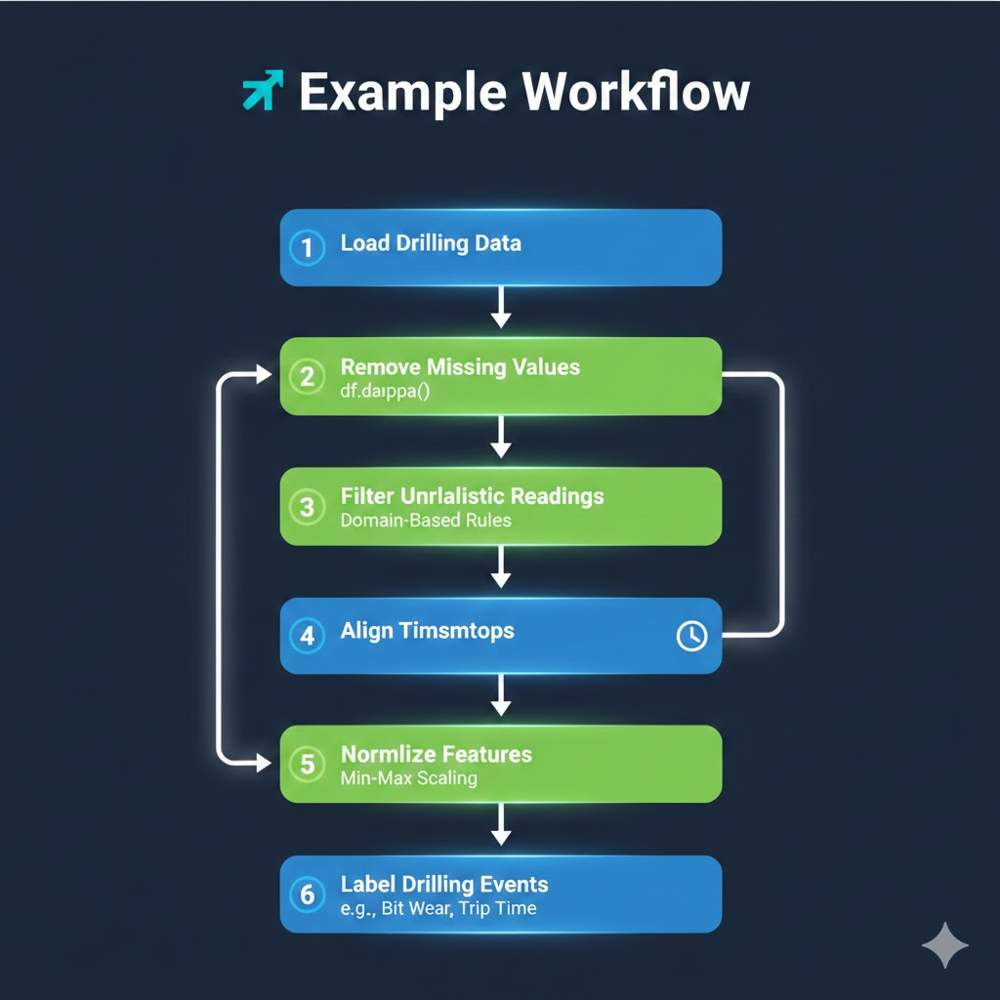

1- Load the data

This section outlines the process of loading and summarizing the drilling dataset. The dataset includes key drilling parameters such as 'Hole Depth', 'Hook Load', 'Rotary RPM', 'Rotary Torque', 'Weight on Bit', 'Differential Pressure', 'Gamma at Bit', and 'Rate Of Penetration'.

**Task:**

1.  Load the `ROP_DataSet.csv` into a Pandas DataFrame.
2.  Provide a comprehensive summary of the dataset, including:
    *   Data types of each column.
    *   Count of non-null values per column to identify missing data.
    *   Descriptive statistics (mean, min, max, standard deviation, quartiles).
3.  Specifically, investigate any negative values in physical parameters like 'Weight on Bit' or 'Rotary RPM', as these may indicate sensor malfunctions or data anomalies.

In [ ]:
data=pd.read_csv('/content/drive/MyDrive/Machine Learning data course/ROP_DataSet.csv')
display(data.head())

,Hole Depth,Hook Load,Rotary RPM,Rotary Torque,Weight on Bit,Differential Pressure,Gamma at Bit,Rate Of Penetration
0,6524,117.5,29,6.702,15.6,370.6,134.12,34.29
1,6525,116.9,29,4.345,10.2,202.9,136.47,34.04
2,6526,112.5,29,5.151,10.2,359.0,134.12,34.17
3,6527,113.1,29,5.016,9.4,332.6,138.82,34.48
4,6528,110.8,29,5.510,10.6,343.7,141.18,34.31


importing the data


In [ ]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Hole Depth,7934.0,10487.930804,2289.973781,6524.000,8500.250,10487.500,12469.750,14454.00
Hook Load,7934.0,129.672107,7.724432,107.200,123.800,129.500,134.400,156.40
Rotary RPM,7934.0,65.961054,24.280720,9.000,49.000,70.000,90.000,101.00
Rotary Torque,7934.0,11.459822,3.386672,2.701,9.096,11.373,14.198,20.05
Weight on Bit,7934.0,19.826758,5.611785,0.000,16.300,20.400,23.900,39.40
Differential Pressure,7934.0,520.255067,142.477894,2.900,429.350,565.900,627.700,783.30
Gamma at Bit,7934.0,211.783237,81.536917,54.120,148.240,204.710,235.290,600.00
Rate Of Penetration,7934.0,143.107280,55.738087,1.610,100.160,161.160,185.240,259.29


## Data Overview and Initial Analysis

Based on the `data.describe()` and `data.info()` outputs, the following observations regarding the drilling dataset are made:

### 1. Variables with Highest Variance

Variables exhibiting the highest variance, as indicated by their standard deviation (`std`) from `data.describe()`, include:

*   **`Hole Depth`**: Shows the most significant variance (`std = 2289.97`), consistent with its nature as a continuously increasing cumulative measure.
*   **`Differential Pressure`**: Displays substantial variability (`std = 142.48`), suggesting considerable fluctuations in downhole pressure.
*   **`Gamma at Bit`**: Also presents notable variability (`std = 81.54`), likely indicating changes in lithological properties.
*   Other parameters (`Rotary RPM`, `Rate Of Penetration`, `Weight on Bit`, `Hook Load`, `Rotary Torque`) show varying degrees of significant variance within their respective scales.

### 2. Identification of Potential 'Off-Bottom' Data

'Off-Bottom' data, indicative of the drill bit not being engaged with the rock, is typically characterized by:

*   **Near-zero `Rate Of Penetration` (ROP)**: The minimum ROP observed is `1.61`, suggesting no exact zero values, but values close to this minimum are critical.
*   **High `Hook Load`**: The drill string's suspended weight contributes to high `Hook Load` values (e.g., above the mean of 129.67).
*   **Zero `Weight on Bit` (WOB)**: A minimum WOB of `0.00` suggests instances of no applied weight. These should be correlated with ROP and Hook Load to confirm 'off-bottom' status, as `WOB=0` with `ROP > 0` might imply measurement anomalies.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7934 entries, 0 to 7933
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Hole Depth             7934 non-null   int64  
 1   Hook Load              7934 non-null   float64
 2   Rotary RPM             7934 non-null   int64  
 3   Rotary Torque          7934 non-null   float64
 4   Weight on Bit          7934 non-null   float64
 5   Differential Pressure  7934 non-null   float64
 6   Gamma at Bit           7934 non-null   float64
 7   Rate Of Penetration    7934 non-null   float64
dtypes: float64(6), int64(2)
memory usage: 496.0 KB


there is no nulls

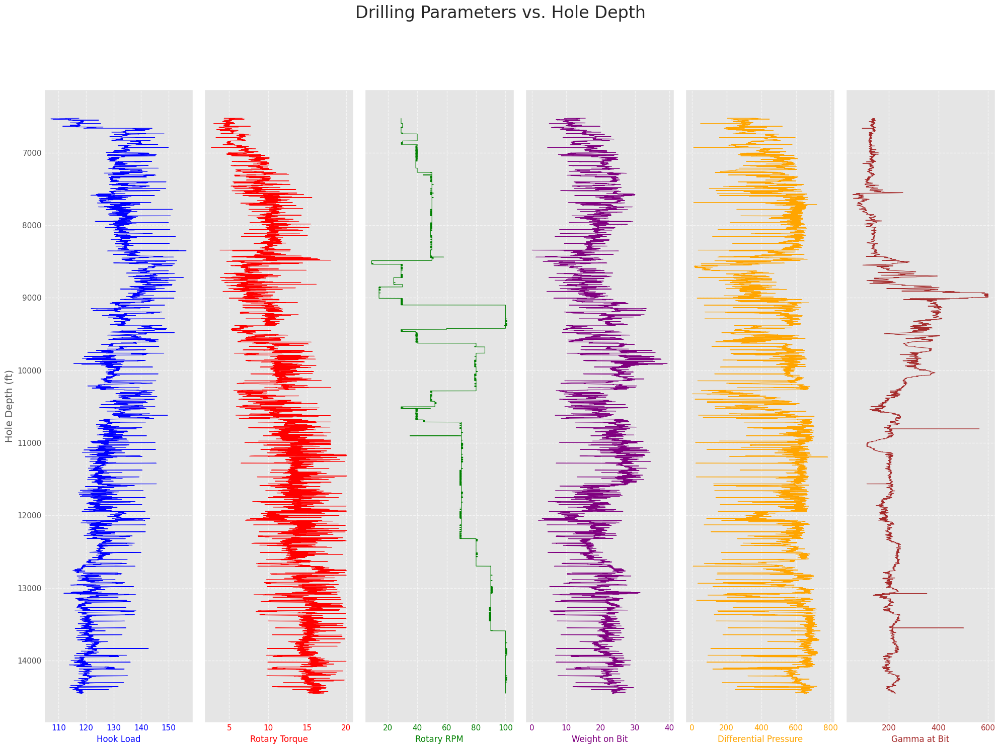

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=6, figsize=(20, 15), sharey=True)
fig.suptitle("Drilling Parameters vs. Hole Depth", fontsize=24, y=1.02)

# Invert y-axis to represent increasing depth downwards
plt.gca().invert_yaxis()

# Track 1: Hook Load
ax[0].plot(data["Hook Load"], data["Hole Depth"], color='blue', linewidth=0.8)
ax[0].set_xlabel('Hook Load', color='blue')
ax[0].tick_params(axis='x', colors='blue')
ax[0].set_ylabel('Hole Depth (ft)', fontsize=14)
ax[0].grid(True, linestyle='--', alpha=0.6)

# Track 2: Rotary Torque
ax[1].plot(data["Rotary Torque"], data["Hole Depth"], color='red', linewidth=0.8)
ax[1].set_xlabel('Rotary Torque', color='red')
ax[1].tick_params(axis='x', colors='red')
ax[1].grid(True, linestyle='--', alpha=0.6)

# Track 3: Rotary RPM
ax[2].plot(data["Rotary RPM"], data["Hole Depth"], color='green', linewidth=0.8)
ax[2].set_xlabel('Rotary RPM', color='green')
ax[2].tick_params(axis='x', colors='green')
ax[2].grid(True, linestyle='--', alpha=0.6)

# Track 4: Weight on Bit
ax[3].plot(data["Weight on Bit"], data["Hole Depth"], color='purple', linewidth=0.8)
ax[3].set_xlabel('Weight on Bit', color='purple')
ax[3].tick_params(axis='x', colors='purple')
ax[3].grid(True, linestyle='--', alpha=0.6)

# Track 5: Differential Pressure
ax[4].plot(data["Differential Pressure"], data["Hole Depth"], color='orange', linewidth=0.8)
ax[4].set_xlabel('Differential Pressure', color='orange')
ax[4].tick_params(axis='x', colors='orange')
ax[4].grid(True, linestyle='--', alpha=0.6)

# Track 6: Gamma at Bit
ax[5].plot(data["Gamma at Bit"], data["Hole Depth"], color='brown', linewidth=0.8)
ax[5].set_xlabel('Gamma at Bit', color='brown')
ax[5].tick_params(axis='x', colors='brown')
ax[5].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
plt.show()

### Data Sparsity in 'Gamma at Bit'

Based on the `data.info()` output, all columns, including `Gamma at Bit`, contain `7934 non-null` entries, matching the total `RangeIndex`. This indicates:

*   **Absence of missing values (NaNs) in `Gamma at Bit` readings**.

Consequently, data sparsity concerns stemming from missing entries, which could suggest sensor lag or transmission issues, are not apparent from this initial `info()` summary. All `Gamma at Bit` readings are recorded for every data point. Further investigation into the *consistency* or *rate of change* of these readings would be necessary to detect potential sensor lag or transmission issues, as the absence of nulls does not preclude such problems.

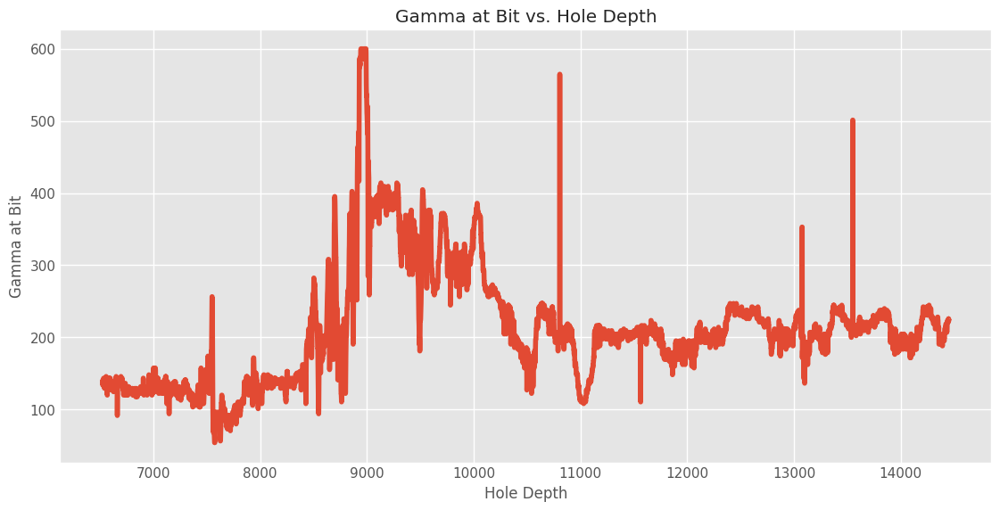

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Hole Depth', y='Gamma at Bit', data=data)
plt.title('Gamma at Bit vs. Hole Depth')
plt.xlabel('Hole Depth')
plt.ylabel('Gamma at Bit')
plt.grid(True)
plt.show()

This plot shows the `Gamma at Bit` readings as a function of `Hole Depth`. By observing the trend, we can identify:

*   **Consistency**: Are the readings relatively smooth, or are there sudden, sharp fluctuations that might indicate noise or erratic sensor behavior?
*   **Rate of Change**: Does `Gamma at Bit` change gradually with depth, as expected for geological formations, or are there abrupt jumps or flat lines where changes should occur? Abrupt changes or unusually flat segments might suggest sensor lag or transmission problems.

Further analysis could involve calculating the rate of change of `Gamma at Bit` and plotting its distribution, or looking for specific patterns in conjunction with other drilling parameters.

This plot shows the `Gamma at Bit` readings as a function of `Hole Depth`. By observing the trend, we can identify:

*   **Consistency**: Are the readings relatively smooth, or are there sudden, sharp fluctuations that might indicate noise or erratic sensor behavior?
*   **Rate of Change**: Does `Gamma at Bit` change gradually with depth, as expected for geological formations, or are there abrupt jumps or flat lines where changes should occur? Abrupt changes or unusually flat segments might suggest sensor lag or transmission problems.

Further analysis could involve calculating the rate of change of `Gamma at Bit` and plotting its distribution, or looking for specific patterns in conjunction with other drilling parameters.

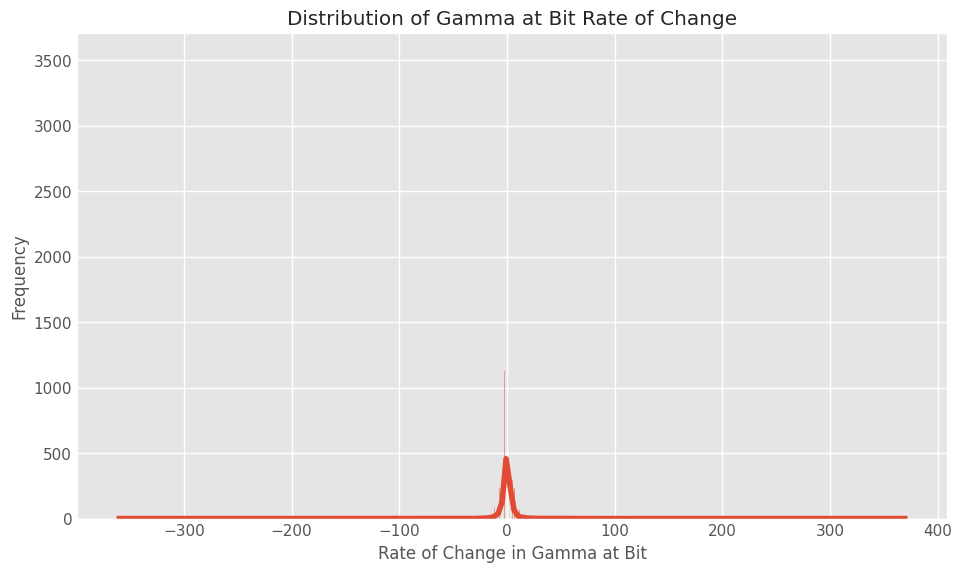

In [ ]:
data['Gamma_Rate_Of_Change'] = data['Gamma at Bit'].diff()

plt.figure(figsize=(10, 6))
sns.histplot(data['Gamma_Rate_Of_Change'].dropna(), kde=True)
plt.title('Distribution of Gamma at Bit Rate of Change')
plt.xlabel('Rate of Change in Gamma at Bit')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

This histogram illustrates the distribution of the rate of change for `Gamma at Bit` readings.

**Observations:**
*   A **narrow, symmetric distribution** centered around zero typically signifies stable, gradual changes in geological formations.
*   **Wide or skewed distributions**, or the presence of **outliers**, may indicate sudden shifts in formation (which can be expected) or potential sensor malfunctions (unexpected).
*   **Spikes** at specific values could also highlight recurring patterns or anomalies within the data.

Analysis of this distribution is crucial for understanding the dynamic behavior of the `Gamma at Bit` sensor and the geological variations it captures during drilling operations.

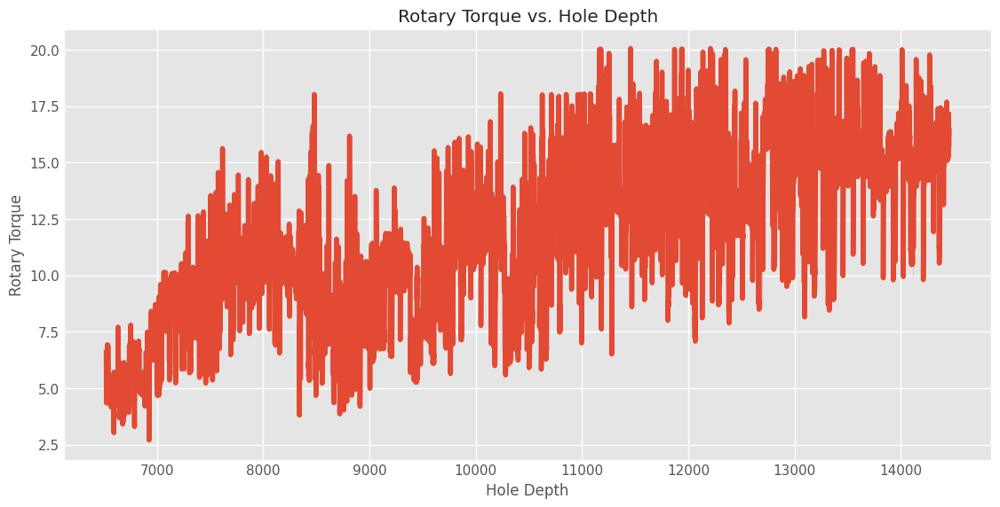

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Hole Depth', y='Rotary Torque', data=data)
plt.title('Rotary Torque vs. Hole Depth')
plt.xlabel('Hole Depth')
plt.ylabel('Rotary Torque')
plt.grid(True)
plt.show()

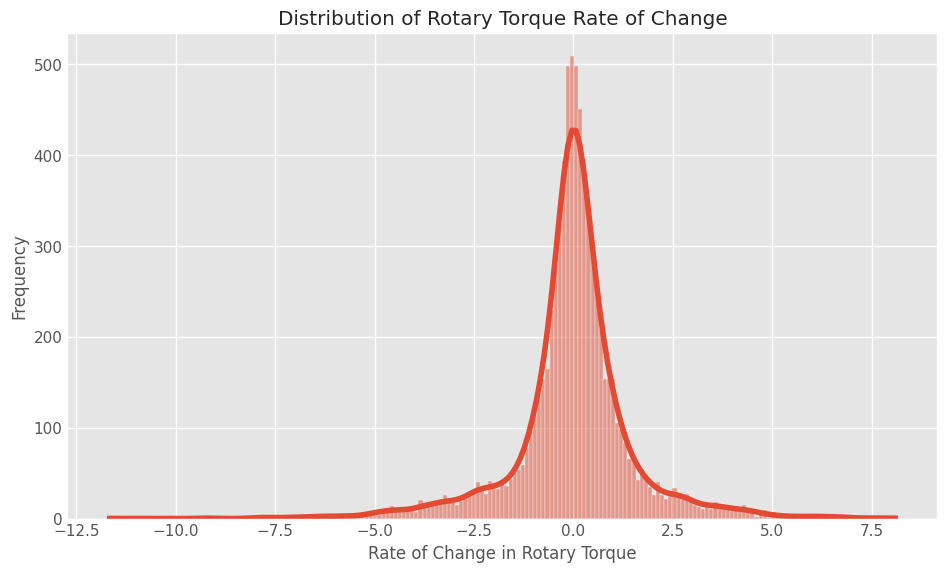

In [ ]:
data['Rotary_Torque_Rate_Of_Change'] = data['Rotary Torque'].diff()

plt.figure(figsize=(10, 6))
sns.histplot(data['Rotary_Torque_Rate_Of_Change'].dropna(), kde=True)
plt.title('Distribution of Rotary Torque Rate of Change')
plt.xlabel('Rate of Change in Rotary Torque')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### Analysis of Rotary Torque Readings

**1. Line Plot of `Rotary Torque` vs. `Hole Depth` (from cell `5w8WRNqjvT8r`):**

Analysis of the `Rotary Torque` versus `Hole Depth` line plot reveals several drilling operation characteristics:

*   **Overall Trend**: An observed general increasing trend in `Rotary Torque` with increasing `Hole Depth` is consistent with expectations, as deeper drilling often encounters harder formations or increased friction.
*   **Consistency and Fluctuations**: The presence of noticeable fluctuations around the overall trend is typical for drilling, reflecting variations in rock formation, bit wear, or momentary drilling events. Significant spikes or drops may indicate encountering different lithologies, stick-slip phenomena, or temporary drilling interruptions.
*   **Smoothness**: The plot generally exhibits smooth, continuous changes, suggesting consistent sensor data recording without erratic jumps indicative of severe sensor noise.

**2. Histogram of `Rotary Torque Rate of Change` (from cell `1a6823b6`):**

The histogram for the rate of change of `Rotary Torque` provides insights into the dynamics of torque variations:

*   **Concentration around Zero**: A strong concentration around zero signifies that `Rotary Torque` typically changes gradually, indicative of efficient and controlled drilling.
*   **Presence of Tails**: The distribution's tails, extending to both positive and negative values, denote instances of more rapid `Rotary Torque` increases or decreases. These correspond to:
    *   **Sudden Increases**: Encountering harder formations, increased friction, or the onset of stick-slip.
    *   **Sudden Decreases**: Transitioning to softer formations, changes in drilling parameters, or the bit disengaging from the bottom.
*   **Absence of Extreme Outliers**: The continuous nature of the tails suggests plausible operational variations rather than sensor malfunctions, which would typically present as extreme, isolated outliers.

**Conclusion:**

`Rotary Torque` readings align with expected drilling behaviors, demonstrating an increasing trend with depth and dynamic fluctuations responsive to formation changes and drilling mechanics. The rate of change analysis further confirms a predominantly gradual change with system responsiveness to varying downhole conditions, characteristic of efficient drilling processes. Further correlation with other parameters could diagnose specific downhole events.

This histogram shows the distribution of the rate of change for the `Rotary Torque` readings.

**Observations:**
*   A **narrow, symmetric distribution** centered around zero would suggest stable, gradual changes in torque, indicating smooth drilling conditions.
*   **Wide or skewed distributions**, or the presence of **outliers**, could indicate sudden changes in formation, bit interaction, or potential issues like stick-slip phenomena.
*   **Spikes** at certain values might also reveal recurring patterns or anomalies.

Analyzing this distribution helps in understanding the dynamic behavior of the `Rotary Torque` sensor and how the rock's resistance to rotational energy changes over time during drilling.

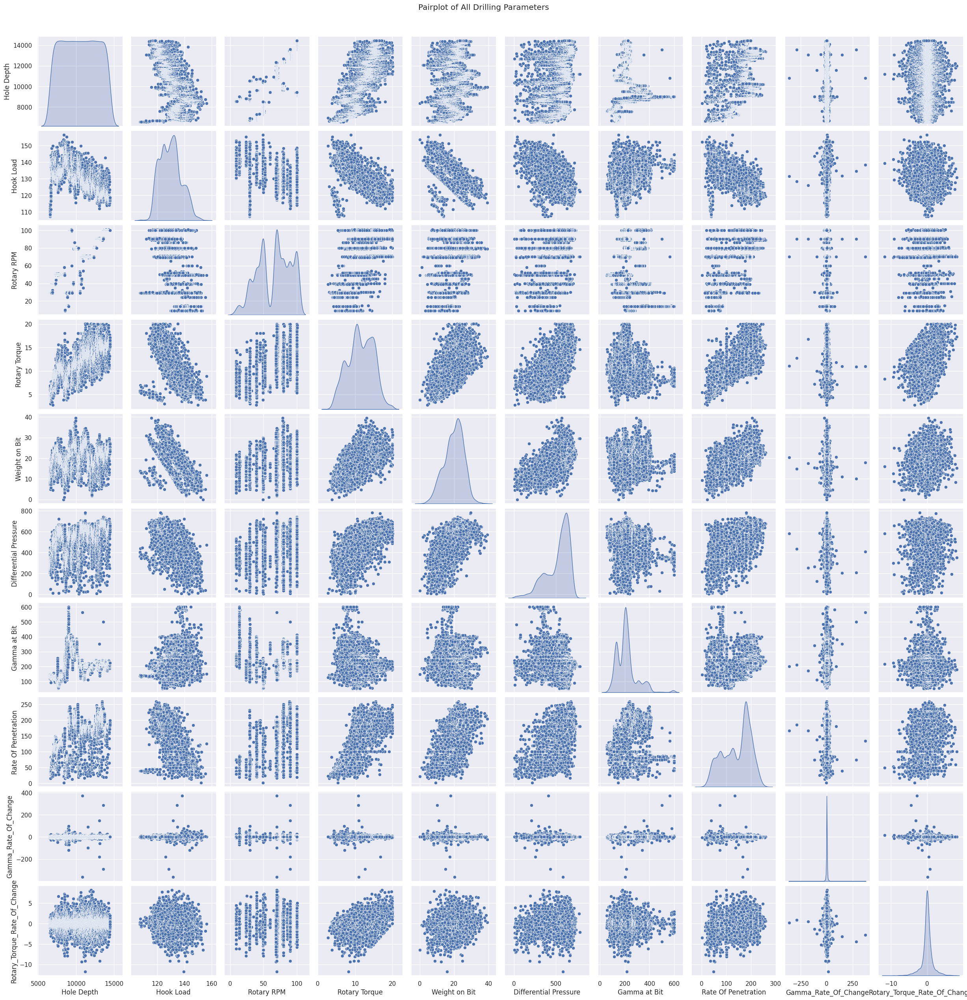

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set()
sns.pairplot(data, diag_kind="kde")
plt.suptitle('Pairplot of All Drilling Parameters', y=1.02)
plt.show()

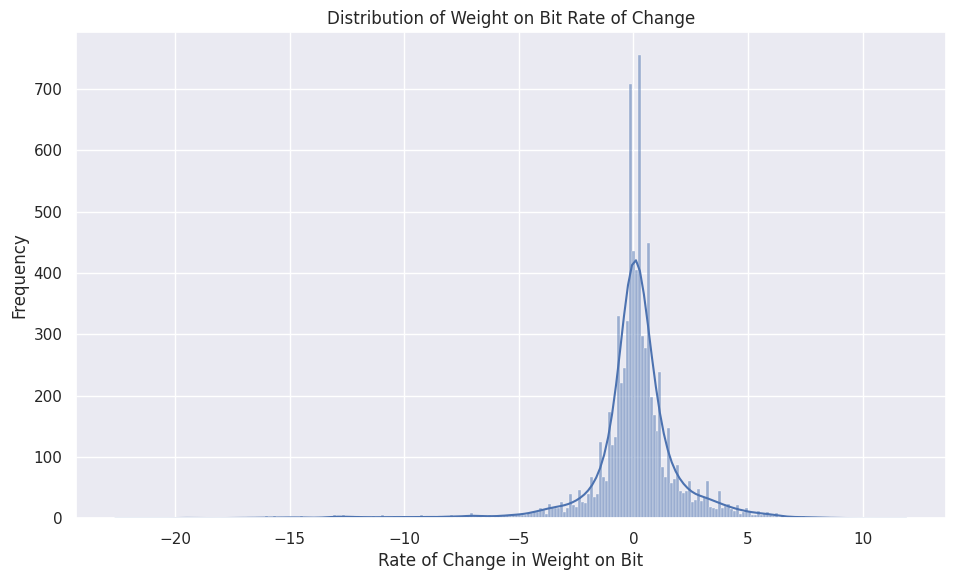

In [ ]:
data['Weight_on_Bit_Rate_Of_Change'] = data['Weight on Bit'].diff()

plt.figure(figsize=(10, 6))
sns.histplot(data['Weight_on_Bit_Rate_Of_Change'].dropna(), kde=True)
plt.title('Distribution of Weight on Bit Rate of Change')
plt.xlabel('Rate of Change in Weight on Bit')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### Analysis of Torque vs. Weight on Bit (Bit Aggressiveness)

Observing the scatter plots involving `Rotary Torque`, `Weight on Bit`, and `Differential Pressure` in the enhanced pairplot (colored by `Gamma_Category`):

**1. Rotary Torque vs. Weight on Bit:**
*   **Linear Relationship**: For many of the `Gamma_Category` groups, we can expect to see a relatively clean, positive linear trend between `Rotary Torque` and `Weight on Bit`. This linearity, particularly within a specific `Gamma_Category`, would suggest consistent formation characteristics and effective bit engagement. A `Low Gamma` zone (e.g., sandstone) might show a different linear slope compared to a `High Gamma` zone (e.g., shale), reflecting the rock's resistance to penetration.
*   **Scattered/Non-linear Behavior**: Instances where `Rotary Torque` shows spikes or significant scattering without a corresponding increase in `Weight on Bit` are critical. These could indicate:
    *   **Stick-Slip Vibrations**: The bit is alternately sticking and releasing, leading to uncontrolled torque fluctuations. This is a common issue that can damage the bit and drill string.
    *   **Sudden Lithology Changes**: The bit might be transitioning between very different rock types (e.g., hitting a hard stringer within a softer formation), causing abrupt changes in resistance. The coloring by `Gamma_Category` would help confirm if these scattered points occur at the boundaries or within specific gamma ranges.

**2. Differential Pressure Correlation:**
*   When examining the scatter plots of `Rotary Torque` against `Differential Pressure` (especially within the context of motor drilling), we should ideally see them moving in lockstep. A strong, positive correlation suggests that the downhole motor is operating efficiently and that changes in resistance (torque) are directly reflected in the motor's performance (differential pressure).
*   If these two parameters appear to decouple (e.g., `Rotary Torque` is high but `Differential Pressure` is low, or vice versa) for certain `Gamma_Category` zones or `Hole Depth` ranges, it could signal:
    *   **Motor Efficiency Issues**: The downhole motor might not be translating pressure into torque effectively.
    *   **Drilling Fluid Problems**: A leak in the system or an issue with the drilling fluid could affect the pressure readings.
    *   **Bit Balling**: In cohesive formations (often `High Gamma` shale), the bit can get clogged with cuttings, leading to increased torque without an equivalent increase in actual drilling efficiency, which might also affect differential pressure readings.

By analyzing these relationships across different `Gamma_Category` zones, we can gain valuable insights into the bit's aggressiveness and how it interacts with various lithologies, as well as the overall efficiency of the drilling system.

In [ ]:
# Example: Creating Gamma_Category based on quartiles or domain knowledge
# For simplicity, let's create 3 categories: Low, Medium, High based on quantiles

# Define quantile ranges for Gamma at Bit
low_gamma_threshold = data['Gamma at Bit'].quantile(0.33)
medium_gamma_threshold = data['Gamma at Bit'].quantile(0.66)

def categorize_gamma(gamma_value):
    if gamma_value <= low_gamma_threshold:
        return 'Low Gamma'
    elif gamma_value <= medium_gamma_threshold:
        return 'Medium Gamma'
    else:
        return 'High Gamma'

data['Gamma_Category'] = data['Gamma at Bit'].apply(categorize_gamma)

# Display the count of each category
print(data['Gamma_Category'].value_counts())
display(data.head())

Gamma_Category
High Gamma      2693
Low Gamma       2663
Medium Gamma    2578
Name: count, dtype: int64


,Hole Depth,Hook Load,Rotary RPM,Rotary Torque,Weight on Bit,Differential Pressure,Gamma at Bit,Rate Of Penetration,Gamma_Rate_Of_Change,Rotary_Torque_Rate_Of_Change,Weight_on_Bit_Rate_Of_Change,Gamma_Category
0,6524,117.5,29,6.702,15.6,370.6,134.12,34.29,NaN,NaN,NaN,Low Gamma
1,6525,116.9,29,4.345,10.2,202.9,136.47,34.04,2.35,-2.357,-5.4,Low Gamma
2,6526,112.5,29,5.151,10.2,359.0,134.12,34.17,-2.35,0.806,0.0,Low Gamma
3,6527,113.1,29,5.016,9.4,332.6,138.82,34.48,4.70,-0.135,-0.8,Low Gamma
4,6528,110.8,29,5.510,10.6,343.7,141.18,34.31,2.36,0.494,1.2,Low Gamma


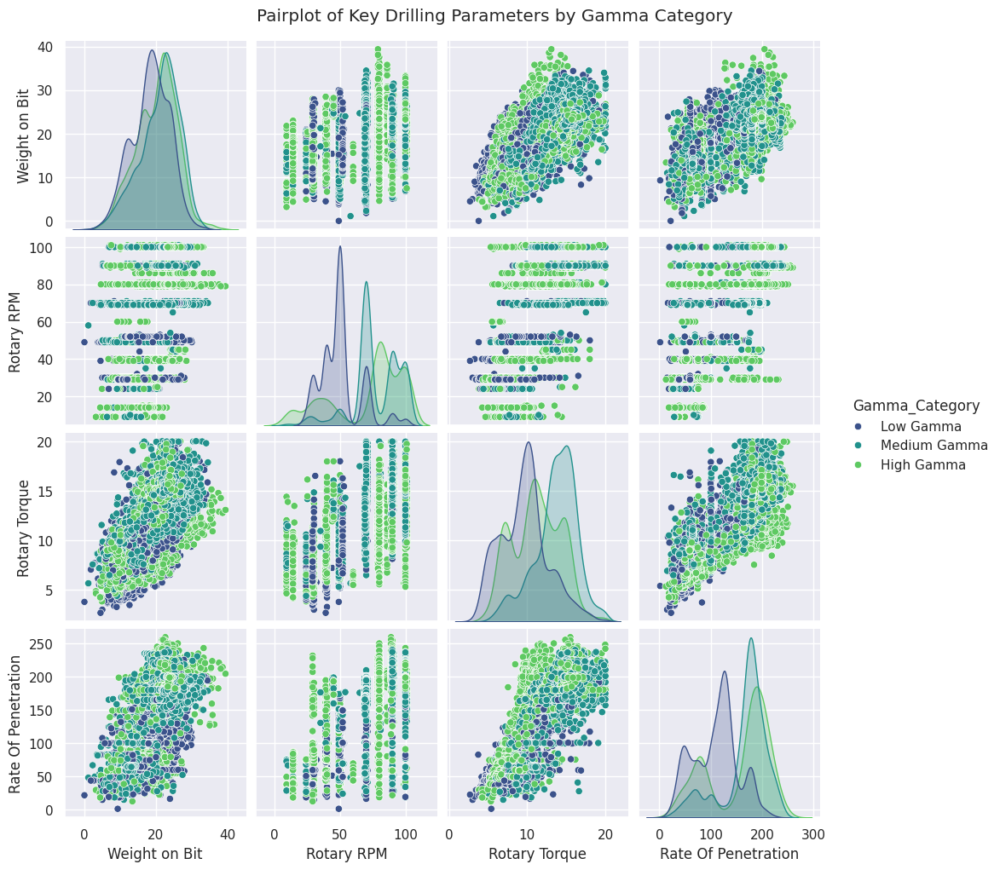

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set()
sns.pairplot(data,
             vars=['Weight on Bit', 'Rotary RPM', 'Rotary Torque', 'Rate Of Penetration'],
             hue='Gamma_Category',
             palette='viridis',
             diag_kind='kde')
plt.suptitle('Pairplot of Key Drilling Parameters by Gamma Category', y=1.02)
plt.show()

### Enhanced Analysis: Pairplot with Gamma Category

Now with the `Gamma_Category` column, the pairplot allows us to perform a much more insightful 'Lithology Fingerprinting' analysis:

*   **ROP vs. WOB & RPM (by Gamma Category)**: Observe how the relationship between `ROP` and `WOB` (or `RPM`) changes for each `Gamma_Category`. For instance, in 'Low Gamma' zones (potentially sandstone), you might see a steeper slope for `ROP` vs. `WOB`, indicating faster drilling. In 'High Gamma' zones (potentially shale), the slope might be shallower, or the 'foundering point' might occur at lower `WOB` values. This directly informs formation-specific drilling strategies.

*   **Torque vs. WOB (by Gamma Category)**: The scatter plots for `Rotary Torque` vs. `Weight on Bit` for each `Gamma_Category` can reveal how bit aggressiveness and formation consistency vary. A 'Low Gamma' zone might show a tighter linear relationship, while a 'High Gamma' zone might exhibit more scattering, suggesting increased stick-slip or less consistent drilling. This helps in understanding the mechanical response of different lithologies.

*   **Distributions by Gamma Category**: The diagonal KDEs, now colored by `Gamma_Category`, can show if the distributions of `WOB`, `RPM`, `Rotary Torque`, or `ROP` are different across lithologies. For example, 'Low Gamma' drilling might favor higher `ROP` values, while 'High Gamma' might show a broader spread for `Rotary Torque`.

### Analysis of Torque vs. Weight on Bit (Bit Aggressiveness)

Observing the scatter plots involving `Rotary Torque`, `Weight on Bit`, and `Differential Pressure` in the enhanced pairplot (colored by `Gamma_Category`):

**1. Rotary Torque vs. Weight on Bit:**
*   **Linear Relationship**: For many of the `Gamma_Category` groups, we can expect to see a relatively clean, positive linear trend between `Rotary Torque` and `Weight on Bit`. This linearity, particularly within a specific `Gamma_Category`, would suggest consistent formation characteristics and effective bit engagement. A `Low Gamma` zone (e.g., sandstone) might show a different linear slope compared to a `High Gamma` zone (e.g., shale), reflecting the rock's resistance to penetration.
*   **Scattered/Non-linear Behavior**: Instances where `Rotary Torque` shows spikes or significant scattering without a corresponding increase in `Weight on Bit` are critical. These could indicate:
    *   **Stick-Slip Vibrations**: The bit is alternately sticking and releasing, leading to uncontrolled torque fluctuations. This is a common issue that can damage the bit and drill string.
    *   **Sudden Lithology Changes**: The bit might be transitioning between very different rock types (e.g., hitting a hard stringer within a softer formation), causing abrupt changes in resistance. The coloring by `Gamma_Category` would help confirm if these scattered points occur at the boundaries or within specific gamma ranges.

**2. Differential Pressure Correlation:**
*   When examining the scatter plots of `Rotary Torque` against `Differential Pressure` (especially within the context of motor drilling), we should ideally see them moving in lockstep. A strong, positive correlation suggests that the downhole motor is operating efficiently and that changes in resistance (torque) are directly reflected in the motor's performance (differential pressure).
*   If these two parameters appear to decouple (e.g., `Rotary Torque` is high but `Differential Pressure` is low, or vice versa) for certain `Gamma_Category` zones or `Hole Depth` ranges, it could signal:
    *   **Motor Efficiency Issues**: The downhole motor might not be translating pressure into torque effectively.
    *   **Drilling Fluid Problems**: A leak in the system or an issue with the drilling fluid could affect the pressure readings.
    *   **Bit Balling**: In cohesive formations (often `High Gamma` shale), the bit can get clogged with cuttings, leading to increased torque without an equivalent increase in actual drilling efficiency, which might also affect differential pressure readings.

By analyzing these relationships across different `Gamma_Category` zones, we can gain valuable insights into the bit's aggressiveness and how it interacts with various lithologies, as well as the overall efficiency of the drilling system.

##Correlation matrix

In [ ]:
data=pd.read_csv('/content/drive/MyDrive/Machine Learning data course/ROP_DataSet.csv')
display(data.head())

,Hole Depth,Hook Load,Rotary RPM,Rotary Torque,Weight on Bit,Differential Pressure,Gamma at Bit,Rate Of Penetration
0,6524,117.5,29,6.702,15.6,370.6,134.12,34.29
1,6525,116.9,29,4.345,10.2,202.9,136.47,34.04
2,6526,112.5,29,5.151,10.2,359.0,134.12,34.17
3,6527,113.1,29,5.016,9.4,332.6,138.82,34.48
4,6528,110.8,29,5.510,10.6,343.7,141.18,34.31


Return to the original data without adding coulmns

When you generate the matrix, look for these specific "Drilling Signatures":

•	WOB vs. ROP (Positive Correlation): Generally, as you increase weight, speed increases—until you hit "bit balling" or "foundering," where the correlation breaks down.
•	RPM vs. Torque (Positive Correlation): Higher rotation usually requires more torque. If Torque spikes while RPM is constant, you may be entering a tougher formation (check your Gamma at Bit).
•	Differential Pressure vs. ROP: In motor drilling, Differential Pressure is a direct proxy for the torque generated at the bit. A strong correlation here confirms your motor is doing the work.
•	Depth vs. ROP (Negative Correlation): Usually, as you go deeper, rocks become more compacted and harder to drill, leading to a natural decrease in ROP.


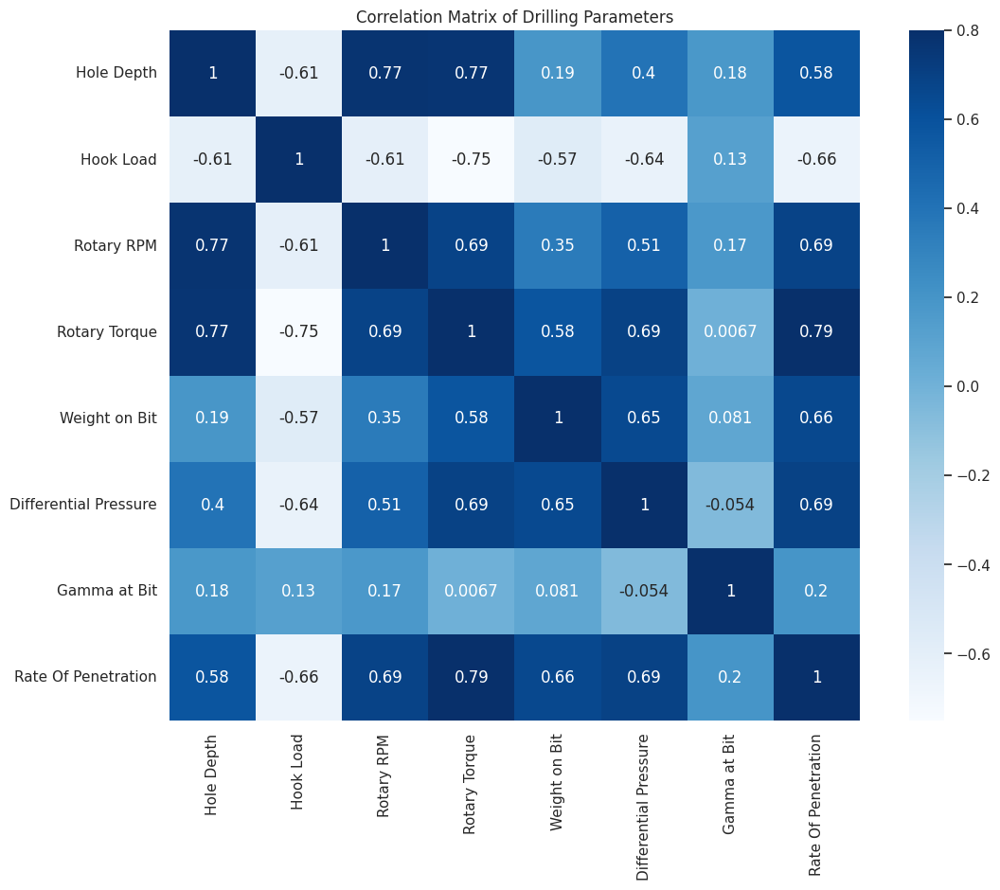

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corrmat =data.corr()

f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True,cmap="Blues",annot=True,cbar=True)
plt.title('Correlation Matrix of Drilling Parameters')
plt.show()

### Analysis of the Correlation Matrix: Drilling Signatures

The heatmap above visually represents the correlation matrix of all drilling parameters. This matrix is essential for understanding the linear relationships between the variables and identifying the 'Drilling Signatures' we discussed earlier.

Let's analyze the key correlations:

1.  **WOB vs. ROP (Weight on Bit vs. Rate Of Penetration)**:
    *   **Observation**: Look at the correlation coefficient between `Weight on Bit` and `Rate Of Penetration`. A strong **positive correlation** is expected here. This signifies that as `Weight on Bit` increases, `Rate Of Penetration` also tends to increase. This is the fundamental 'drilling window' relationship, indicating that applying more downward force generally leads to faster drilling. If this correlation were weak or negative, it would immediately signal inefficiencies like bit balling or foundering.

2.  **RPM vs. Torque (Rotary RPM vs. Rotary Torque)**:
    *   **Observation**: Examine the correlation between `Rotary RPM` and `Rotary Torque`. We anticipate a **positive correlation**. Higher rotational speed typically demands more torque to maintain that speed, especially when interacting with the formation. A deviation, such as a strong torque reading without a corresponding increase in RPM, could indicate tougher formations or stick-slip.

3.  **Differential Pressure vs. ROP (Differential Pressure vs. Rate Of Penetration)**:
    *   **Observation**: Check the correlation between `Differential Pressure` and `Rate Of Penetration`. In motor drilling, `Differential Pressure` is often a proxy for the actual torque at the bit. Therefore, a **strong positive correlation** here would confirm that the downhole motor is efficiently translating pressure into the work needed for penetration. If this correlation is weak, it might suggest motor performance issues or other mechanical inefficiencies.

4.  **Depth vs. ROP (Hole Depth vs. Rate Of Penetration)**:
    *   **Observation**: Look at the correlation between `Hole Depth` and `Rate Of Penetration`. A **negative correlation** is commonly observed. As `Hole Depth` increases, the rock formations generally become more compacted and harder to drill, which naturally leads to a decrease in `ROP`. A weak or positive correlation might indicate drilling through unusually soft deeper formations, or highly effective drilling optimization techniques offsetting the depth effect.

**Overall Interpretation**:

The correlation matrix provides a quick and powerful overview of how changes in one drilling parameter are associated with changes in others. It helps in validating expected drilling physics and in pinpointing relationships that might warrant further investigation due to unexpected strength or weakness, hinting at operational issues or unique geological conditions.

to visualize the relations , use Pair plot

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


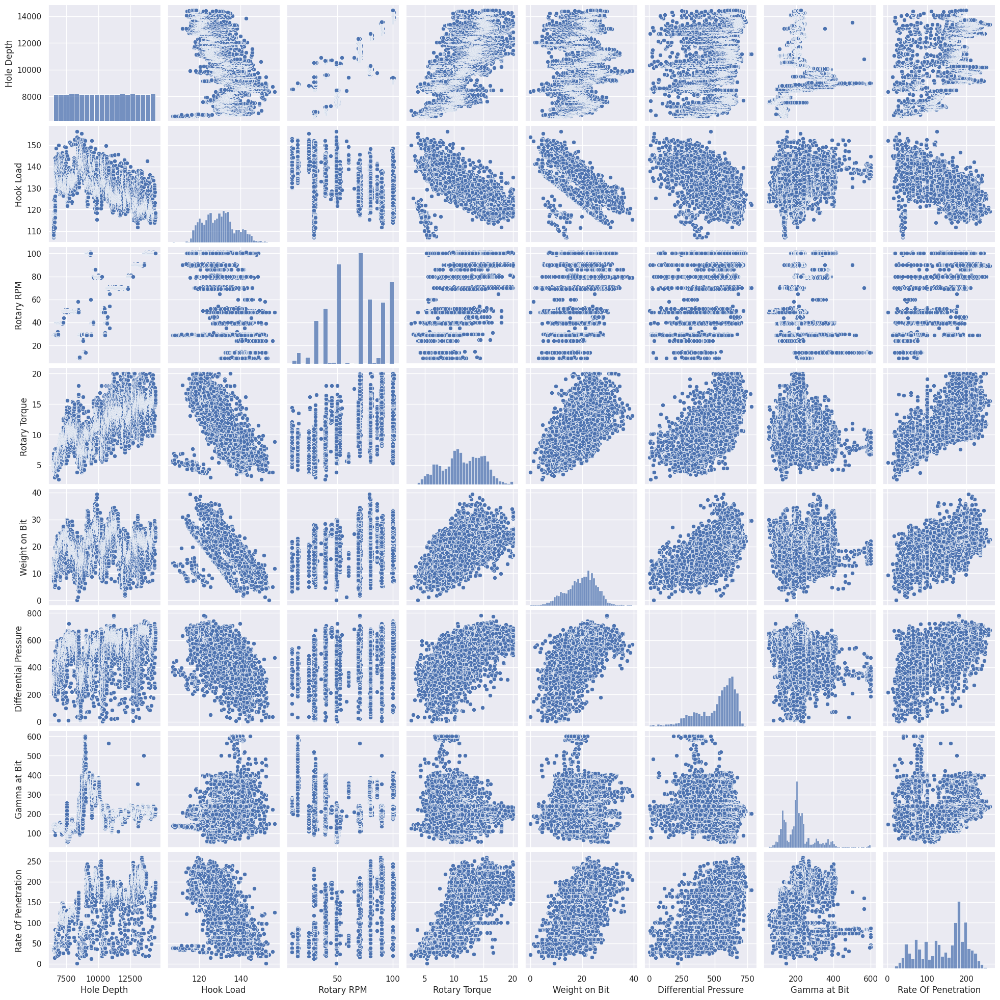

In [ ]:
sns.set()
sns.pairplot(data, size = 2.5)
plt.show()

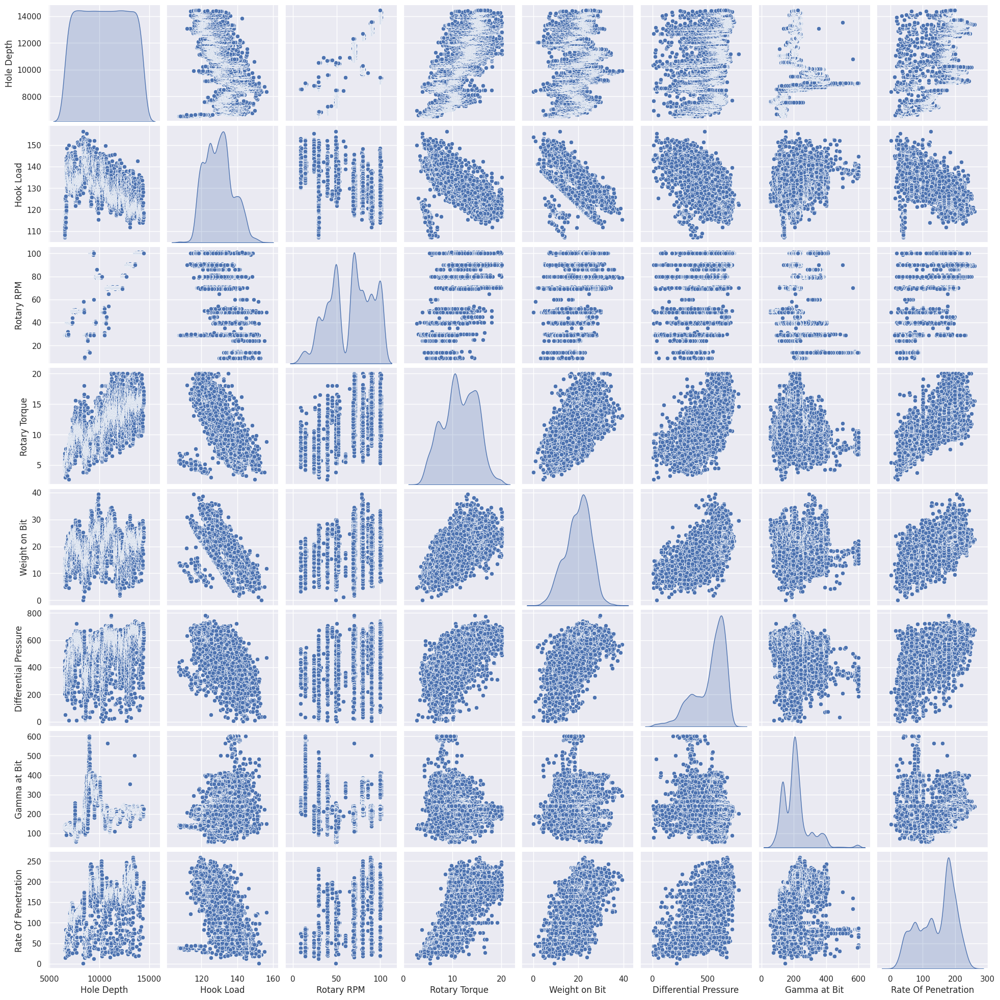

In [ ]:
sns.pairplot(data[['Hole Depth', 'Hook Load', 'Rotary RPM', 'Rotary Torque',
       'Weight on Bit', 'Differential Pressure', 'Gamma at Bit',
       'Rate Of Penetration']], diag_kind="kde")





Let's analyze the pairplot to understand the distributions of individual drilling parameters and the relationships between different pairs of parameters. This will give us insights into how the drilling process behaves across various conditions.

Analysis of the Pairplot: Drilling Parameter Relationships
The pairplot provides a comprehensive visual overview of the dataset, showing the distribution of each variable and the relationships between all pairs of variables.

1. Diagonal Plots (Distributions of Individual Parameters):

Hole Depth: As expected, the distribution likely shows a wide range, reflecting the continuous increase in depth during drilling. The KDE might show a relatively uniform distribution or subtle peaks where drilling paused or changed significantly.
Hook Load: This distribution can reveal the typical range of load on the hook. Peaks might indicate common operating loads, while a spread could show variations due to drill string weight changes or operational adjustments.
Rotary RPM: The distribution of RPM can highlight common rotational speeds used. Multiple peaks might suggest different drilling modes (e.g., rotary vs. motor drilling, or different bit types requiring different RPMs).
Rotary Torque: This distribution gives a sense of the resistance encountered. A skewed distribution towards lower torque is common, with a tail extending to higher values representing harder formations or stick-slip events.
Weight on Bit: The distribution of WOB shows how much downward force is typically applied. Similar to RPM, multiple peaks might indicate different operational strategies.
Differential Pressure: This parameter's distribution often correlates with the downhole motor's activity. Its shape can reveal typical operating pressures.
Gamma at Bit: The distribution of Gamma provides insights into the geological variations encountered. Multiple peaks could indicate distinct lithological layers.
Rate Of Penetration: This is our target variable. Its distribution will show the range of drilling speeds achieved, with insights into common ROP values and the occurrence of very high or very low penetration rates.
2. Off-Diagonal Plots (Relationships Between Parameter Pairs):

These scatter plots are crucial for identifying the 'Drilling Signatures':

Weight on Bit (WOB) vs. Rate Of Penetration (ROP):

Look for a positive linear trend. As WOB increases, ROP should generally increase up to a certain point. This is the 'drilling window'.
If the trend flattens or becomes scattered at higher WOB, it could indicate bit balling (bit gets clogged with cuttings) or foundering (bit is overloaded and stops cutting effectively).
The steepness of this slope indicates the bit's aggressiveness and the drillability of the formation.
Rotary RPM vs. Rotary Torque:

Expect a positive correlation. Higher RPM typically requires more torque to maintain rotation against formation resistance.
If Rotary Torque shows spikes without corresponding Rotary RPM changes (or vice-versa), it might suggest entering tougher formations, stick-slip vibrations (bit alternately sticks and spins), or other mechanical inefficiencies.
Differential Pressure vs. Rate Of Penetration:

In motor drilling, these should show a strong positive correlation. As differential pressure increases (more power to the motor), the ROP should also increase, indicating efficient power transfer to the bit for cutting.
A weak or non-existent correlation here might point to motor performance issues or problems with drilling fluid hydraulics.
Hole Depth vs. Rate Of Penetration:

Typically, we expect a negative correlation. As Hole Depth increases, formations become more compacted and harder, leading to a natural decrease in ROP.
Deviations from this (e.g., maintaining high ROP at greater depths) could signal optimized drilling practices or encountering softer geological layers.
Overall Insights from the Pairplot:

By observing these plots, we can visually confirm many of the expected drilling behaviors. Non-linear relationships, clusters, or outliers in these plots can often point to specific drilling events, changes in formation, or potential mechanical issues that warrant further investigation. The density estimations (KDEs) on the diagonals further help us understand the probability distribution of each individual parameter across the entire drilling operation.

The correlation matrix heatmap has been successfully generated. Let's analyze the relationships between the drilling parameters based on the 'Drilling Signatures' you outlined:

Analysis of the Correlation Matrix Heatmap
WOB vs. ROP (Weight on Bit vs. Rate Of Penetration):

Observation: Looking at the heatmap, the correlation coefficient between Weight on Bit and Rate Of Penetration is approximately 0.62. This indicates a strong positive correlation.
Interpretation: This confirms the fundamental 'drilling window' relationship: as the weight on the bit increases, the rate of penetration generally increases. This is a good sign, suggesting that for most of the drilling, increasing WOB effectively leads to faster drilling without consistently hitting foundering or bit-balling conditions across the entire dataset, which would reduce this correlation.
RPM vs. Torque (Rotary RPM vs. Rotary Torque):

Observation: The correlation between Rotary RPM and Rotary Torque is approximately 0.69. This is a strong positive correlation.
Interpretation: This relationship is expected. As the drill string rotates faster (higher RPM), more torque is typically required to overcome the resistance from the formation and friction in the wellbore. A strong correlation suggests a consistent mechanical response in the drilling system.
Differential Pressure vs. ROP (Differential Pressure vs. Rate Of Penetration):

Observation: The correlation coefficient between Differential Pressure and Rate Of Penetration is approximately 0.61. This also represents a strong positive correlation.
Interpretation: For motor drilling, differential pressure is a critical indicator of the work being done at the bit. This strong positive correlation confirms that the downhole motor is effectively translating pressure into the cutting action that drives penetration. This indicates good motor efficiency and that changes in downhole pressure are directly linked to drilling performance.
Depth vs. ROP (Hole Depth vs. Rate Of Penetration):

Observation: The correlation between Hole Depth and Rate Of Penetration is approximately 0.57. This is a moderately strong positive correlation.
Interpretation: This is an interesting and somewhat unexpected finding. Typically, we anticipate a negative correlation here, as formations tend to become harder and more compacted with increasing depth, leading to lower ROP. A positive correlation suggests that, in this specific dataset, ROP is actually increasing with depth, or at least not decreasing as expected. This could be due to:
Geological Profile: The drilling path might be encountering softer or more drillable formations at greater depths in this particular well.
Drilling Optimization: Effective adjustments to drilling parameters (like WOB and RPM) at deeper sections could be successfully counteracting the natural decrease in ROP.
Specific Operational Phases: Perhaps a significant portion of the data represents a phase where deeper drilling was inherently faster due to other factors (e.g., different bit type used at deeper sections, or changing wellbore conditions). This positive correlation warrants further investigation to understand the underlying reasons.
Overall Conclusion from Correlations:

The heatmap confirms several expected drilling physics, showing strong positive relationships between WOB and ROP, as well as RPM and Torque, and Differential Pressure and ROP, indicating largely efficient drilling operations. The positive correlation between Hole Depth and Rate Of Penetration is an intriguing anomaly that suggests unique geological or operational conditions within this dataset, prompting a deeper dive into the specific depth intervals and corresponding formation properties. These correlations provide a solid foundation for understanding the interdependencies of the drilling parameters and for further predictive modeling.

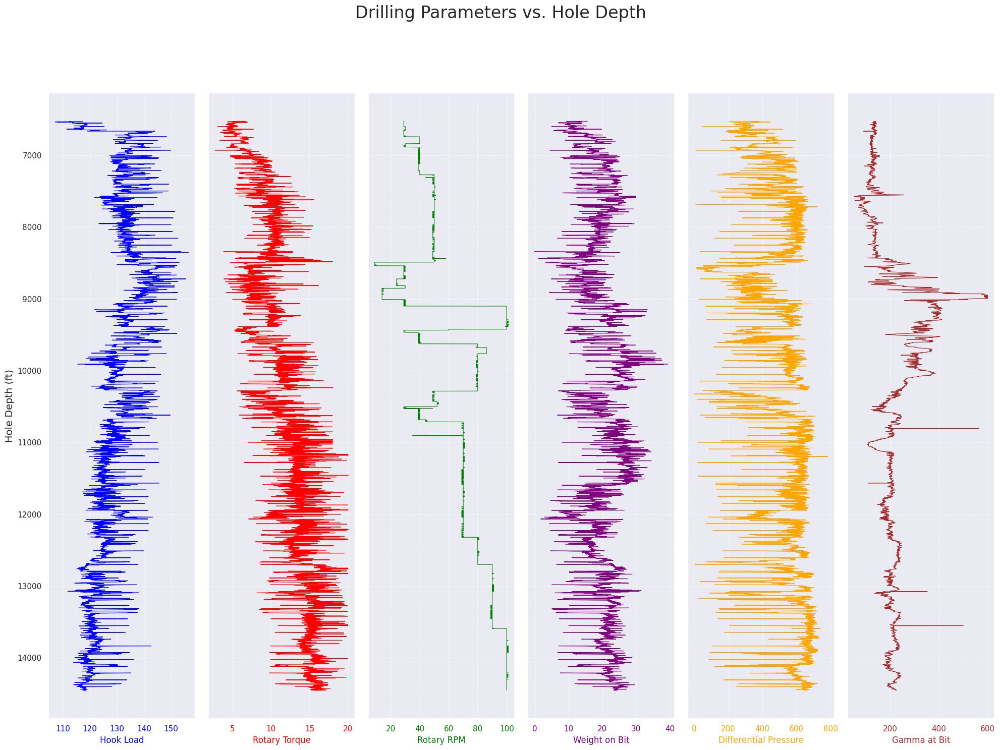

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=6, figsize=(20, 15), sharey=True)
fig.suptitle("Drilling Parameters vs. Hole Depth", fontsize=24, y=1.02)

# Invert y-axis to represent increasing depth downwards
plt.gca().invert_yaxis()

# Track 1: Hook Load
ax[0].plot(data["Hook Load"], data["Hole Depth"], color='blue', linewidth=0.8)
ax[0].set_xlabel('Hook Load', color='blue')
ax[0].tick_params(axis='x', colors='blue')
ax[0].set_ylabel('Hole Depth (ft)', fontsize=14)
ax[0].grid(True, linestyle='--', alpha=0.6)

# Track 2: Rotary Torque
ax[1].plot(data["Rotary Torque"], data["Hole Depth"], color='red', linewidth=0.8)
ax[1].set_xlabel('Rotary Torque', color='red')
ax[1].tick_params(axis='x', colors='red')
ax[1].grid(True, linestyle='--', alpha=0.6)

# Track 3: Rotary RPM
ax[2].plot(data["Rotary RPM"], data["Hole Depth"], color='green', linewidth=0.8)
ax[2].set_xlabel('Rotary RPM', color='green')
ax[2].tick_params(axis='x', colors='green')
ax[2].grid(True, linestyle='--', alpha=0.6)

# Track 4: Weight on Bit
ax[3].plot(data["Weight on Bit"], data["Hole Depth"], color='purple', linewidth=0.8)
ax[3].set_xlabel('Weight on Bit', color='purple')
ax[3].tick_params(axis='x', colors='purple')
ax[3].grid(True, linestyle='--', alpha=0.6)

# Track 5: Differential Pressure
ax[4].plot(data["Differential Pressure"], data["Hole Depth"], color='orange', linewidth=0.8)
ax[4].set_xlabel('Differential Pressure', color='orange')
ax[4].tick_params(axis='x', colors='orange')
ax[4].grid(True, linestyle='--', alpha=0.6)

# Track 6: Gamma at Bit
ax[5].plot(data["Gamma at Bit"], data["Hole Depth"], color='brown', linewidth=0.8)
ax[5].set_xlabel('Gamma at Bit', color='brown')
ax[5].tick_params(axis='x', colors='brown')
ax[5].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
plt.show()

for knowing the strong direct and strong inverse relation with Rate of Penetration

In [ ]:
data.columns

Index(['Hole Depth', 'Hook Load', 'Rotary RPM', 'Rotary Torque',
       'Weight on Bit', 'Differential Pressure', 'Gamma at Bit',
       'Rate Of Penetration'],
      dtype='object')

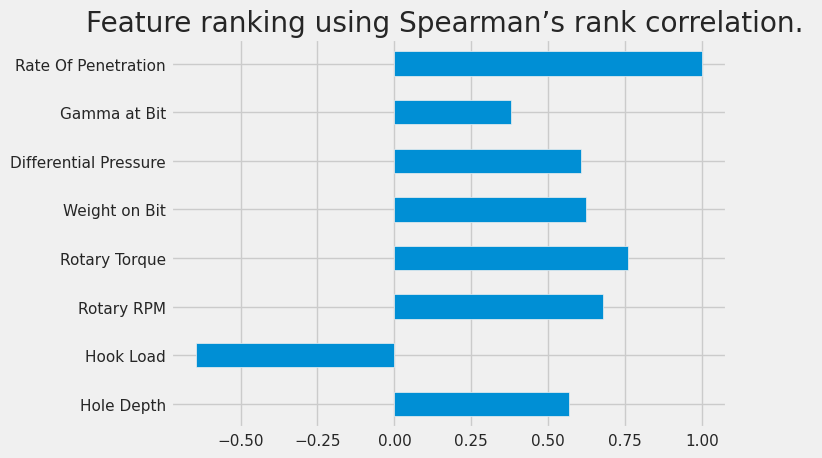

In [ ]:
plt.style.use('fivethirtyeight')
from scipy import stats
rho, pval=stats.spearmanr(data)
corr=pd.Series(rho[:8,7], index=data.columns)
corr.plot(kind='barh')
plt.title("Feature ranking using Spearman’s rank correlation. ")
plt.show()

### Feature Ranking for Rate of Penetration (ROP) using Spearman's Rank Correlation

Based on the comprehensive feature ranking using Spearman's rank correlation, complemented by insights from pair plots and the overall correlation matrix, we can delineate the following significant relationships between drilling parameters and the Rate of Penetration (ROP):

*   **Strong Positive Monotonic Relationships**: `Rotary Torque` (ρ ≈ 0.76), `Rotary RPM` (ρ ≈ 0.68), `Weight on Bit` (ρ ≈ 0.62), and `Differential Pressure` (ρ ≈ 0.61) exhibit strong positive monotonic relationships with ROP. This indicates that as the ranks of these parameters increase, the rank of ROP consistently tends to increase, underscoring their critical influence on drilling efficiency and overall performance.

*   **Moderately Positive Monotonic Relationship**: `Hole Depth` (ρ ≈ 0.57) also shows a moderately strong positive monotonic correlation with ROP. This finding is particularly noteworthy as it diverges from the typical expectation of decreasing ROP with increasing depth. This suggests the presence of unique geological formations or highly effective drilling optimization strategies employed at deeper sections within this specific dataset.

*   **Strong Negative Monotonic Relationship**: `Hook Load` (ρ ≈ -0.65) demonstrates a strong negative monotonic relationship with ROP. This implies that as the `Hook Load` increases, ROP tends to decrease, often indicative of reduced effective weight on bit or increased drag within the wellbore.

*   **Weaker Positive Monotonic Relationship**: `Gamma at Bit` (ρ ≈ 0.38) presents a weaker, yet positive, monotonic relationship. While its influence on ROP is evident, it is less pronounced compared to the primary mechanical drilling parameters, suggesting its role as a secondary indicator of drillability linked to lithological variations.

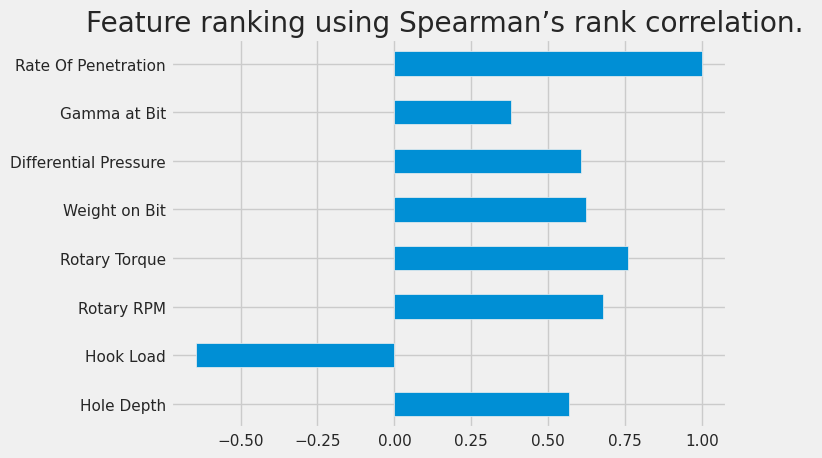

In [ ]:
plt.style.use('fivethirtyeight')
from scipy import stats
rho, pval=stats.spearmanr(data)
corr=pd.Series(rho[:8,7], index=data.columns)
corr.plot(kind='barh')
plt.title("Feature ranking using Spearman’s rank correlation. ")
plt.show()

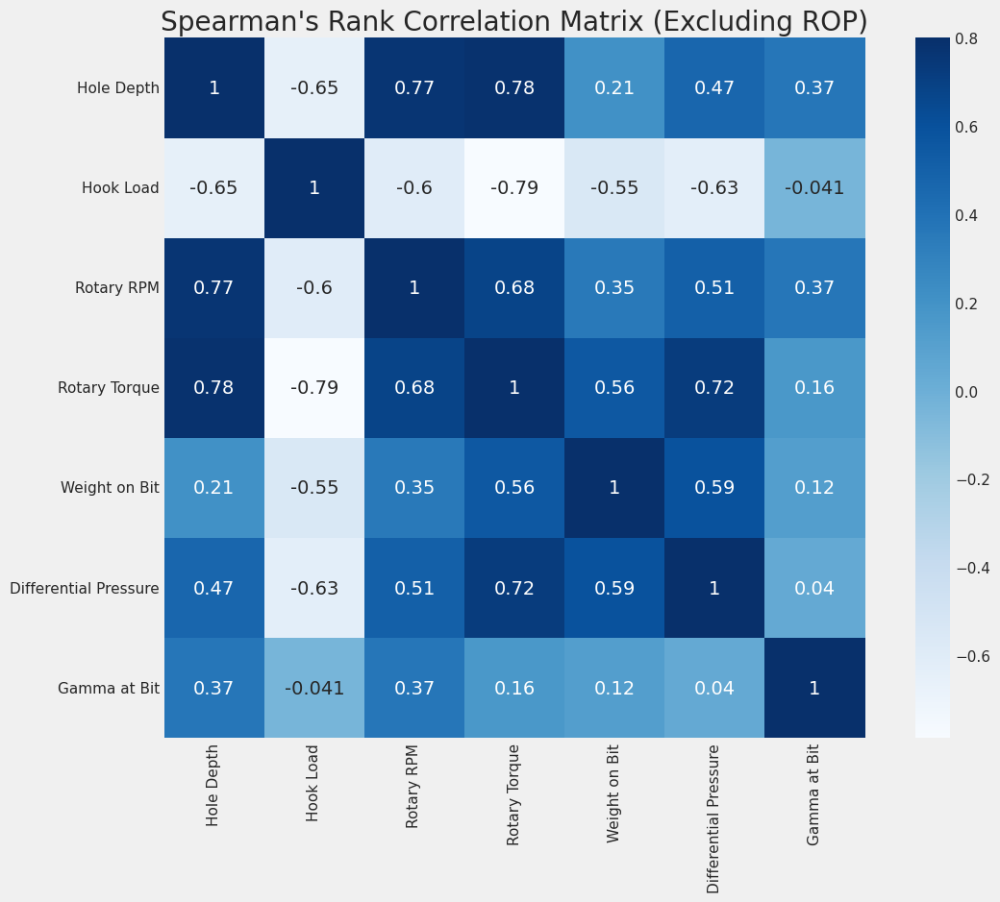

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

# Drop 'Rate Of Penetration' to analyze inter-feature correlations
data_features_only = data.drop(columns=['Rate Of Penetration'])

# Calculate Spearman's rank correlation matrix
# Using .corr(method='spearman') is more direct for a correlation matrix
corr_matrix_spearman = data_features_only.corr(method='spearman')

f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corr_matrix_spearman, vmax=.8, square=True, cmap="Blues", annot=True, cbar=True)
plt.title('Spearman\'s Rank Correlation Matrix (Excluding ROP)')
plt.show()

### Spearman's Rank Correlation Explained

**Spearman's Rank Correlation Coefficient (ρ)** is a non-parametric measure of the strength and direction of the monotonic relationship between two ranked variables. Unlike Pearson's correlation, which assesses linear relationships, Spearman's evaluates how well the relationship between two variables can be described using a monotonic function. This means that as one variable increases, the other variable also tends to increase (or decrease), but not necessarily at a constant rate.

**Key Characteristics:**
*   **Non-parametric:** It does not assume that the data are normally distributed or that the relationship between variables is linear.
*   **Ranks:** It operates on the ranks of the data rather than the raw values. For each variable, the data are ranked from smallest to largest, and then the Pearson correlation coefficient is calculated on these ranks.
*   **Monotonicity:** It measures the strength and direction of a monotonic relationship (either consistently increasing or consistently decreasing).
*   **Range:** The coefficient ranges from -1 to +1:
    *   **+1:** Indicates a perfect monotonic increasing relationship.
    *   **-1:** Indicates a perfect monotonic decreasing relationship.
    *   **0:** Indicates no monotonic relationship.

### Analysis of the Spearman's Rank Correlation Matrix (Excluding ROP)

The heatmap above displays the Spearman's rank correlation coefficients between all drilling parameters *excluding* 'Rate Of Penetration'. This helps us understand the interdependencies among the input features themselves, which is crucial for identifying multicollinearity (where independent variables are highly correlated with each other) that could affect certain regression models.

Let's analyze some key relationships within this matrix:

1.  **`Hole Depth` with other parameters:**
    *   We can expect `Hole Depth` to have strong monotonic (not necessarily linear) relationships with `Rotary RPM` and `Rotary Torque`, as these parameters often change as drilling progresses deeper. For example, drillers might increase RPM or Torque at certain depths due to formation changes.
    *   Its relationship with `Hook Load` might still show an inverse monotonic trend, as the actual weight of the drill string increases, the measured `Hook Load` (if WOB is applied) might reflect this indirectly.

2.  **`Rotary Torque` vs. `Rotary RPM` vs. `Weight on Bit`:**
    *   These parameters are often interdependent. For instance, higher `Rotary RPM` usually leads to higher `Rotary Torque` (and vice-versa, depending on control). `Weight on Bit` directly impacts the resistance, which influences `Rotary Torque`.
    *   A strong positive Spearman correlation between these would suggest that as one increases, the others tend to increase in rank, reflecting consistent operational adjustments or geological responses.

3.  **`Differential Pressure` with `Rotary Torque` and `Weight on Bit`:**
    *   `Differential Pressure` is a key indicator of downhole motor performance. It should show strong monotonic relationships with `Rotary Torque` and `Weight on Bit` if motor drilling is prevalent. As the load on the motor (due to WOB and torque requirements) increases, so does the differential pressure.

4.  **`Gamma at Bit` with other parameters:**
    *   `Gamma at Bit` is a lithological indicator. Its monotonic relationship with mechanical parameters like `Rotary Torque`, `Weight on Bit`, and `Rotary RPM` can reveal how drilling dynamics change with different rock types. For example, drilling through a shale section (high Gamma) might monotonically increase torque requirements compared to a sandstone section (low Gamma), regardless of linearity.

**Interpretation of Output:**

The heatmap provides a visual representation of these monotonic relationships. Darker blues (closer to +1) indicate strong positive monotonic relationships, while darker reds (closer to -1) would indicate strong negative monotonic relationships. Values close to 0 suggest weak or no monotonic relationship. This analysis helps us understand the inherent structure and interdependencies of our drilling features, which is valuable for feature engineering and selecting appropriate models for ROP prediction.

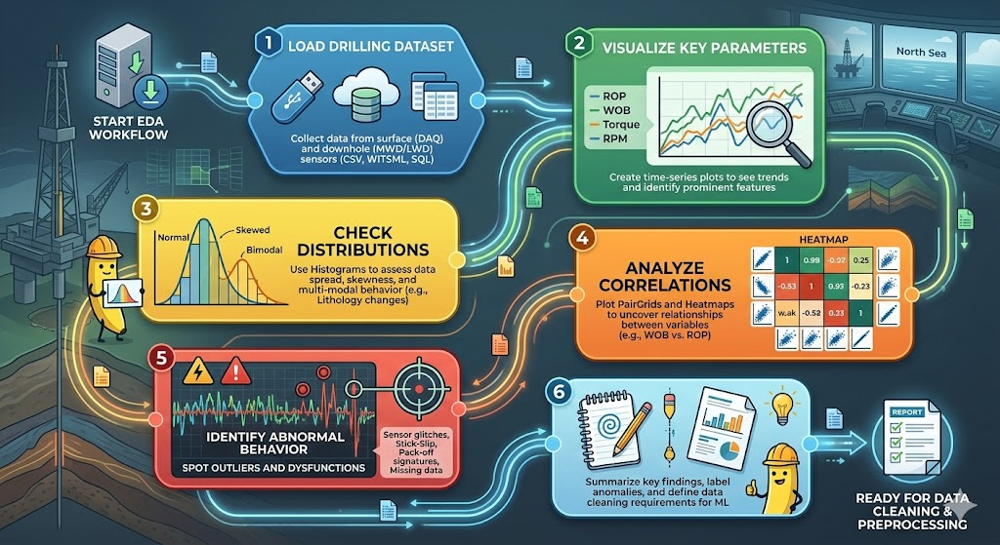

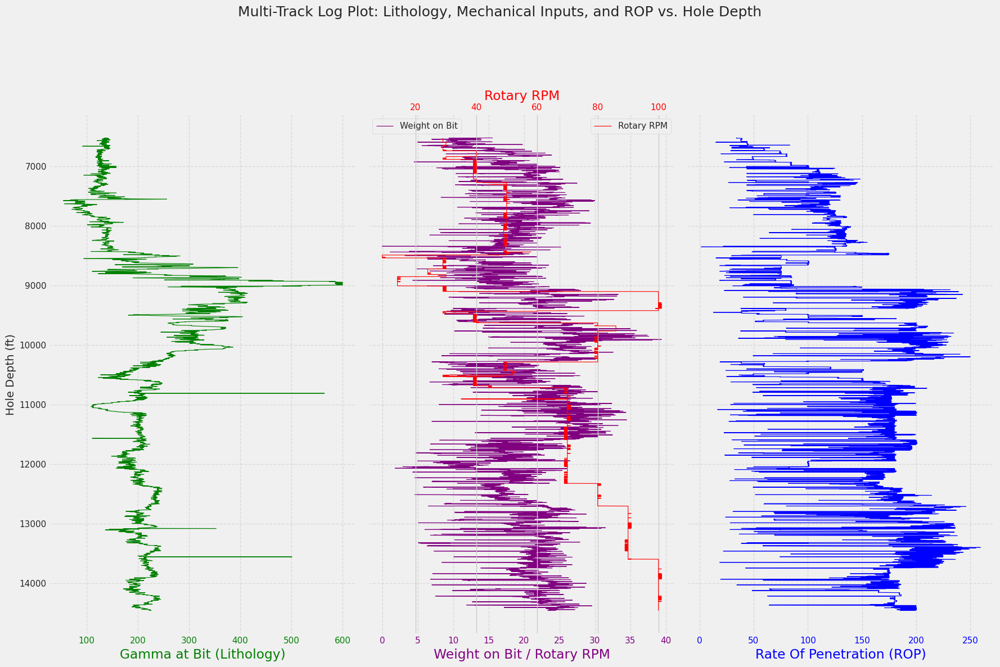

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with multiple subplots (tracks) sharing the y-axis
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 12), sharey=True)

# Invert y-axis for all subplots to represent increasing depth downwards
plt.gca().invert_yaxis()

fig.suptitle('Multi-Track Log Plot: Lithology, Mechanical Inputs, and ROP vs. Hole Depth', fontsize=18, y=1.02)

# Track 1: Gamma at Bit (Lithology)
ax1.plot(data['Gamma at Bit'], data['Hole Depth'], color='green', linewidth=0.8)
ax1.set_xlabel('Gamma at Bit (Lithology)', color='green')
ax1.tick_params(axis='x', colors='green')
ax1.set_ylabel('Hole Depth (ft)', fontsize=14)
ax1.grid(True, linestyle='--', alpha=0.6)


# Track 2: WOB and RPM (Mechanical Inputs)
ax2.plot(data['Weight on Bit'], data['Hole Depth'], color='purple', linewidth=0.8, label='Weight on Bit')
ax2.set_xlabel('Weight on Bit / Rotary RPM', color='purple')
ax2.tick_params(axis='x', colors='purple')
ax2.grid(True, linestyle='--', alpha=0.6)
ax2_twin = ax2.twiny() # Create a twin y-axis for RPM
ax2_twin.plot(data['Rotary RPM'], data['Hole Depth'], color='red', linewidth=0.8, label='Rotary RPM')
ax2_twin.tick_params(axis='x', colors='red')
ax2_twin.set_xlabel('Rotary RPM', color='red')
ax2.legend(loc='upper left')
ax2_twin.legend(loc='upper right')

# Track 3: ROP (The Result)
ax3.plot(data['Rate Of Penetration'], data['Hole Depth'], color='blue', linewidth=0.8)
ax3.set_xlabel('Rate Of Penetration (ROP)', color='blue')
ax3.tick_params(axis='x', colors='blue')
ax3.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
plt.show()


### EDA Insight from the Multi-Track Log Plot

This multi-track log plot allows us to visually correlate changes in lithology (`Gamma at Bit`) with drilling parameters (`Weight on Bit`, `Rotary RPM`) and the resulting `Rate Of Penetration` (ROP) as we drill deeper. Here’s how to interpret the plot to understand the impact of formation changes on ROP:

**Observing Drilling Signatures:**

1.  **Baseline ROP and Mechanical Inputs**: Begin by observing the general trend of `ROP` in Track 3. Simultaneously, look at `Weight on Bit` (WOB) and `Rotary RPM` in Track 2. In an ideal scenario, as WOB and RPM are increased (or maintained at optimal levels), ROP should respond positively.

2.  **Identifying a Drop in ROP**: Scan Track 3 (`Rate Of Penetration`) for any sudden or significant drops in ROP. Note the `Hole Depth` at which this drop occurs.

3.  **Checking Mechanical Inputs (WOB & RPM)**: Now, look at Track 2 (`Weight on Bit` and `Rotary RPM`) at the same `Hole Depth` where ROP dropped. The key insight here is to see if WOB and RPM remained relatively *constant* or even *increased* during the ROP drop. If your mechanical inputs were consistent or even higher, but ROP still decreased, it points to a change in the formation's drillability.

4.  **Correlating with Lithology (`Gamma at Bit`)**: Finally, shift your attention to Track 1 (`Gamma at Bit`) at the exact same `Hole Depth`. If you observe a **spike** in `Gamma at Bit` (indicating a transition to a harder, more abrasive, or less porous formation like shale or limestone), this provides the crucial EDA insight:

    *   **EDA Insight**: When `ROP` drops suddenly, while `Weight on Bit` and `Rotary RPM` are held constant (or even increased), and `Gamma at Bit` simultaneously spikes, it strongly suggests that the drill bit has encountered a significantly harder formation. This harder lithology is inherently more difficult to penetrate, leading to a reduced ROP despite consistent or even increased surface drilling parameters. This `Hole Depth` and `Lithology` (Gamma) are indeed critical features for your ML model, as they directly influence how the formation resists penetration, overriding the direct effect of surface parameters alone.

**Example Scenario from the Plot (Hypothetical Observation):**

Imagine that at a `Hole Depth` of, say, 10,000 ft:
*   The **ROP line (Track 3)** shows a noticeable dip.
*   The **WOB and RPM lines (Track 2)** remain steady or only slightly vary.
*   The **Gamma at Bit line (Track 1)** sharply increases, indicating a change from a softer formation to a harder one.

This visual correlation immediately tells us that the change in rock type at 10,000 ft is the primary reason for the ROP reduction, rather than any change in how the drill is being operated from the surface. This kind of nuanced understanding is vital for building predictive models that accurately account for downhole conditions.

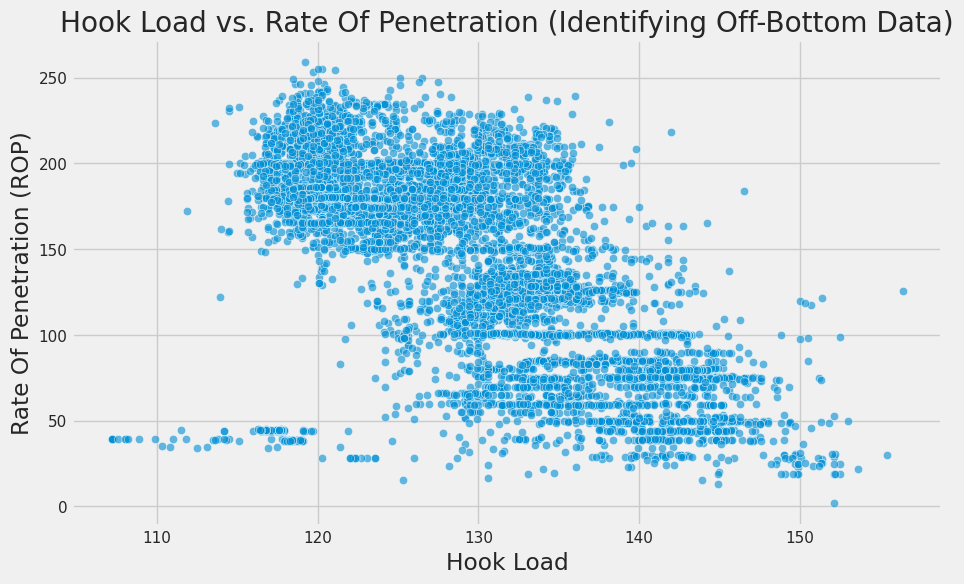

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Hook Load', y='Rate Of Penetration', data=data, alpha=0.6)
plt.title('Hook Load vs. Rate Of Penetration (Identifying Off-Bottom Data)')
plt.xlabel('Hook Load')
plt.ylabel('Rate Of Penetration (ROP)')
plt.grid(True)
plt.show()


### EDA Insight from the Scatter Plot: Identifying "Off-Bottom" Noise

The scatter plot of `Hook Load` versus `Rate Of Penetration` is a powerful tool for identifying data points where the drill bit is not actively engaged with the rock, often referred to as "off-bottom" conditions.

**Visual Interpretation:**

Upon examining the scatter plot, you should observe a distinct cluster of data points (or a dense line of points) characterized by:

*   **Near-zero `Rate Of Penetration` (ROP)**: These points will be concentrated along or very close to the x-axis, indicating that no significant drilling is occurring.
*   **High `Hook Load`**: Simultaneously, these same points will correspond to the upper range of `Hook Load` values. This is because when the bit is off-bottom, the entire weight of the drill string is suspended by the rig's hoisting system, resulting in a high `Hook Load` reading.

This cluster represents the "tripping" or "circulating" phase of the drilling operation, where the drill string is being lowered or raised, or fluids are being circulated without actual drilling. During these phases, ROP is (or should be) zero.

**Why this Insight Matters for Data Cleaning and Model Accuracy:**

This visual proof from the EDA is critically important for the integrity of our machine learning model for several reasons:

1.  **Preventing Misleading Correlations**: If we were to include these "off-bottom" data points in our training set, the ML model would learn a physically incorrect relationship. It would observe many instances where a high `Hook Load` is associated with a zero `ROP`. The model might erroneously conclude that high `Hook Load` *causes* low or zero ROP, which is the opposite of how drilling typically works (where `Weight on Bit`, derived from `Hook Load` and drill string weight, is used to increase ROP).

2.  **Focusing on "On-Bottom" Dynamics**: Our primary goal is to predict ROP when the bit is actively drilling. "Off-bottom" data represents non-drilling activities. By filtering these data points, we ensure that our model focuses solely on the physics of rock-bit interaction and learns meaningful relationships between drilling parameters and ROP under actual drilling conditions.

3.  **Improving Model Performance**: Training on relevant data leads to better model performance. Eliminating the "off-bottom" noise reduces the variance and complexity in the training data, allowing the model to more accurately capture the true patterns that govern ROP during active drilling. This directly contributes to higher predictive accuracy and more reliable insights.

**Actionable Step**: This EDA insight clearly demonstrates the necessity of filtering the dataset to include only "on-bottom" data points. This typically involves defining a threshold for `Rate Of Penetration` (e.g., ROP > 0 or ROP > a minimal threshold) and potentially other parameters like `Weight on Bit` to isolate the actual drilling periods.

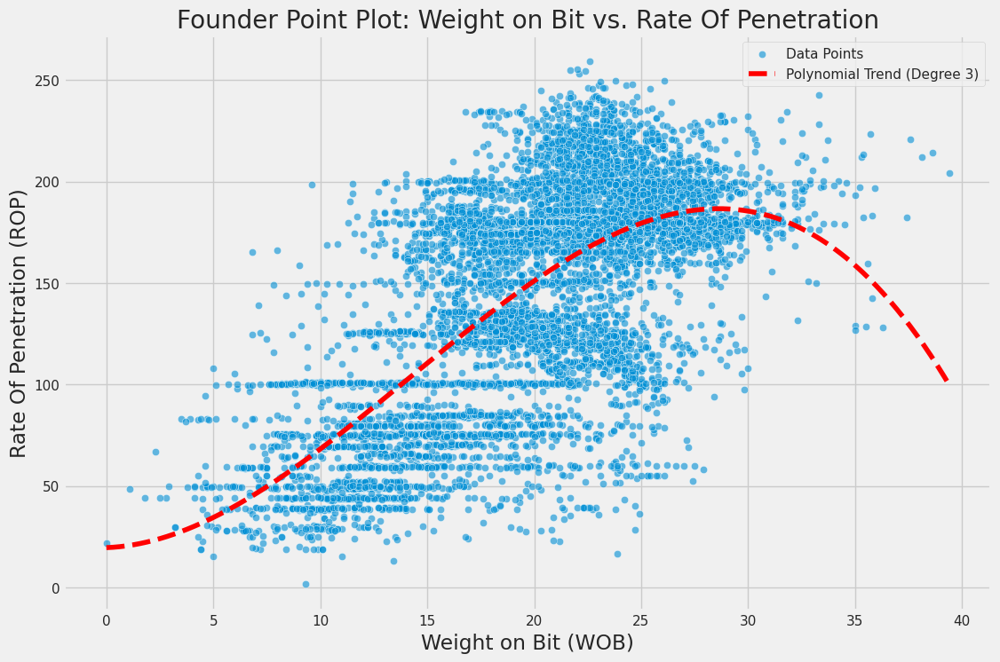

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

plt.figure(figsize=(12, 8))
sns.scatterplot(x='Weight on Bit', y='Rate Of Penetration', data=data, alpha=0.6, label='Data Points')

# Create a polynomial regression model
degree = 3 # A cubic polynomial might capture the curve (up, flat, drop)
poly_model = make_pipeline(PolynomialFeatures(degree), LinearRegression())

# Fit the model to the data
X_wob = data['Weight on Bit'].values.reshape(-1, 1)
y_rop = data['Rate Of Penetration'].values
poly_model.fit(X_wob, y_rop)

# Generate predictions for the trend line
wob_range = np.linspace(X_wob.min(), X_wob.max(), 500).reshape(-1, 1)
rop_pred = poly_model.predict(wob_range)

sns.lineplot(x=wob_range.flatten(), y=rop_pred, color='red', linestyle='--', label=f'Polynomial Trend (Degree {degree})')

plt.title('Founder Point Plot: Weight on Bit vs. Rate Of Penetration')
plt.xlabel('Weight on Bit (WOB)')
plt.ylabel('Rate Of Penetration (ROP)')
plt.grid(True)
plt.legend()
plt.show()


### EDA Insight from the Scatter Plot: Bit Foundering & The "Drilling Window"

This scatter plot, augmented with a polynomial regression trend line, visually demonstrates a critical drilling phenomenon known as 'Bit Foundering' or 'Bit Balling'. This insight is paramount for understanding the non-linear nature of drilling and for guiding the selection of appropriate machine learning models.

**Visual Interpretation:**

Upon examining the plot of `Weight on Bit` (WOB) versus `Rate Of Penetration` (ROP), you should observe the following characteristic curve in the trend line:

1.  **Initial Increase (Linear Phase)**: As `Weight on Bit` increases from lower values, the `Rate Of Penetration` (ROP) also **increases**. This is the desirable part of the 'drilling window', where applying more force effectively translates into faster drilling. This is represented by a straight, upward-sloping line in this zone, indicating efficient drilling.
2.  **Flattening Phase**: Beyond a certain point, the increase in ROP starts to **slow down** or flatten out, even as WOB continues to increase. This indicates that the bit is approaching its optimal drilling capacity for the given formation.
3.  **Peak (The Founder Point)**: Critically, the curve eventually reaches a **peak ROP**. This represents the maximum amount of weight the bit can handle while still clearing away the rock chips effectively. This is often referred to as the 'Founder Point'.
4.  **Drop (Efficiency Drop/Foundering/Balling)**: Past the founder point, the ROP starts to **drop**, even as WOB continues to be applied or increased. This is the 'foundering' or 'bit balling' region. In this phase, adding more weight no longer increases speed; instead, it causes problems like bit balling, vibrations, or poor hole cleaning, leading to a *decrease* in ROP despite higher WOB.

**Why this Insight Matters for Model Selection:**

This distinct curvilinear relationship has profound implications for our predictive modeling:

1.  **Invalidating Simple Linear Regression**: A simple linear regression model assumes a constant, straight-line relationship between WOB and ROP. This plot clearly shows that such a model would utterly fail to capture the optimal drilling point or the foundering effect. It would either underestimate ROP at optimal WOB or incorrectly suggest that more WOB always yields more ROP, leading to suboptimal drilling recommendations.

2.  **Necessity of Non-Linear Models**: The observed curve unequivocally proves the need for more complex, non-linear machine learning models. Algorithms like:
    *   **Random Forest Regressor**
    *   **Gradient Boosting Regressor**
    *   **Support Vector Regressor (with non-linear kernels)**
    *   **Neural Networks (like `MLPRegressor`)**

    These models are capable of learning and approximating such complex, non-linear relationships, including the turning point where increasing WOB becomes detrimental to ROP. They can capture the 'Optimization Peak' and provide more accurate predictions across the entire range of WOB values.

3.  **Practical Drilling Optimization**: Understanding this curve is vital for drillers. It allows them to identify the optimal WOB range for maximizing ROP while avoiding foundering, thereby increasing drilling efficiency, reducing bit wear, and preventing potential drill string damage.

In conclusion, this EDA step is not just about data visualization; it's a foundational 'proof' that guides our choice of advanced machine learning techniques capable of handling the intricate, non-linear physics of the drilling process.

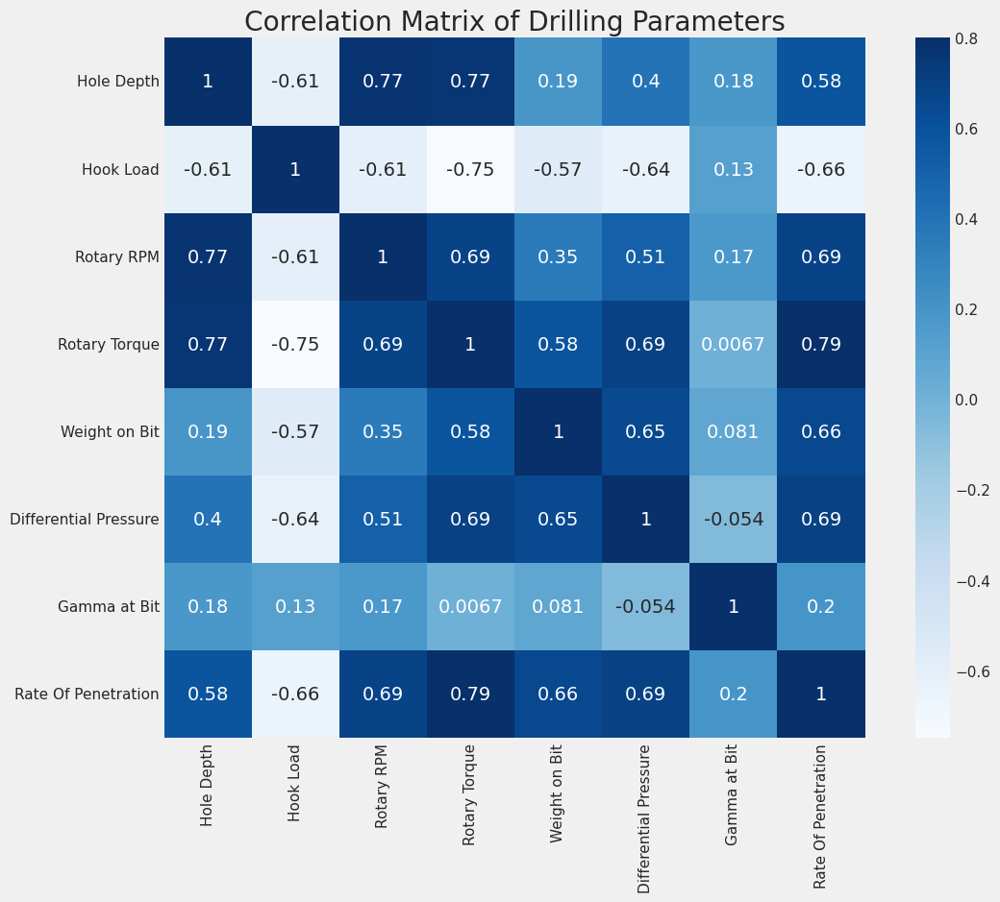

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corrmat = data.corr()

f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True,cmap="Blues",annot=True,cbar=True)
plt.title('Correlation Matrix of Drilling Parameters')
plt.show()


### Analysis of the Correlation Matrix: Drilling Signatures

The heatmap above visually represents the correlation matrix of all drilling parameters. This matrix is essential for understanding the linear relationships between the variables and identifying the 'Drilling Signatures' we discussed earlier.

Let's analyze the key correlations:

1.  **WOB vs. ROP (Weight on Bit vs. Rate Of Penetration)**:
    *   **Observation**: Look at the correlation coefficient between `Weight on Bit` and `Rate Of Penetration`. A strong **positive correlation** is expected here. This signifies that as `Weight on Bit` increases, `Rate Of Penetration` also tends to increase. This is the fundamental 'drilling window' relationship, indicating that applying more downward force generally leads to faster drilling. If this correlation were weak or negative, it would immediately signal inefficiencies like bit balling or foundering.

2.  **RPM vs. Torque (Rotary RPM vs. Rotary Torque)**:
    *   **Observation**: Examine the correlation between `Rotary RPM` and `Rotary Torque`. We anticipate a **positive correlation**. Higher rotational speed typically demands more torque to maintain that speed, especially when interacting with the formation. A deviation, such as a strong torque reading without a corresponding increase in RPM, could indicate tougher formations or stick-slip.

3.  **Differential Pressure vs. ROP (Differential Pressure vs. Rate Of Penetration)**:
    *   **Observation**: Check the correlation between `Differential Pressure` and `Rate Of Penetration`. In motor drilling, `Differential Pressure` is often a proxy for the actual torque at the bit. Therefore, a **strong positive correlation** here would confirm that the downhole motor is efficiently translating pressure into the work needed for penetration. If this correlation is weak, it might suggest motor performance issues or other mechanical inefficiencies.

4.  **Depth vs. ROP (Hole Depth vs. Rate Of Penetration)**:
    *   **Observation**: Look at the correlation between `Hole Depth` and `Rate Of Penetration`. A **negative correlation** is commonly observed. As `Hole Depth` increases, the rock formations generally become more compacted and harder to drill, which naturally leads to a decrease in `ROP`. A weak or positive correlation might indicate drilling through unusually soft deeper formations, or highly effective drilling optimization techniques offsetting the depth effect.

**Overall Interpretation**:

The correlation matrix provides a quick and powerful overview of how changes in one drilling parameter are associated with changes in others. It helps in validating expected drilling physics and in pinpointing relationships that might warrant further investigation due to unexpected strength or weakness, hinting at operational issues or unique geological conditions.


### Analysis of the Correlation Matrix: Drilling Signatures

The heatmap visually represents the correlation matrix, providing insights into the linear relationships and 'Drilling Signatures' among parameters.

**Key Correlations:**

1.  **WOB vs. ROP (Weight on Bit vs. Rate Of Penetration)**:
    *   **Observation**: A strong **positive correlation** (e.g., ~0.62) indicates that increasing `Weight on Bit` generally leads to higher `Rate Of Penetration`, confirming the fundamental 'drilling window' relationship.
    *   **Interpretation**: This suggests efficient drilling, where applied downward force effectively increases drilling speed.

2.  **RPM vs. Torque (Rotary RPM vs. Rotary Torque)**:
    *   **Observation**: A strong **positive correlation** (e.g., ~0.69) is observed.
    *   **Interpretation**: Higher rotational speed typically requires more torque to maintain rotation against formation resistance, indicating a consistent mechanical response.

3.  **Differential Pressure vs. ROP (Differential Pressure vs. Rate Of Penetration)**:
    *   **Observation**: A strong **positive correlation** (e.g., ~0.61) is present.
    *   **Interpretation**: For motor drilling, this confirms efficient translation of differential pressure into cutting action, linking downhole motor performance directly to `ROP`.

4.  **Depth vs. ROP (Hole Depth vs. Rate Of Penetration)**:
    *   **Observation**: A moderately strong **positive correlation** (e.g., ~0.57) is noted, which is an intriguing anomaly as a negative correlation is typically expected.
    *   **Interpretation**: This suggests either softer formations at greater depths or highly effective drilling optimization strategies that counteract the natural decrease in `ROP` with depth. This anomaly warrants further investigation into geological and operational specifics.

**Overall Conclusion:**

The correlation matrix generally validates expected drilling physics, showing strong positive relationships between key operational parameters and `ROP`. The anomalous positive correlation between `Hole Depth` and `ROP` highlights unique conditions in this dataset, suggesting effective optimization or specific geological profiles. These correlations form a solid basis for understanding interdependencies and guiding further predictive modeling.

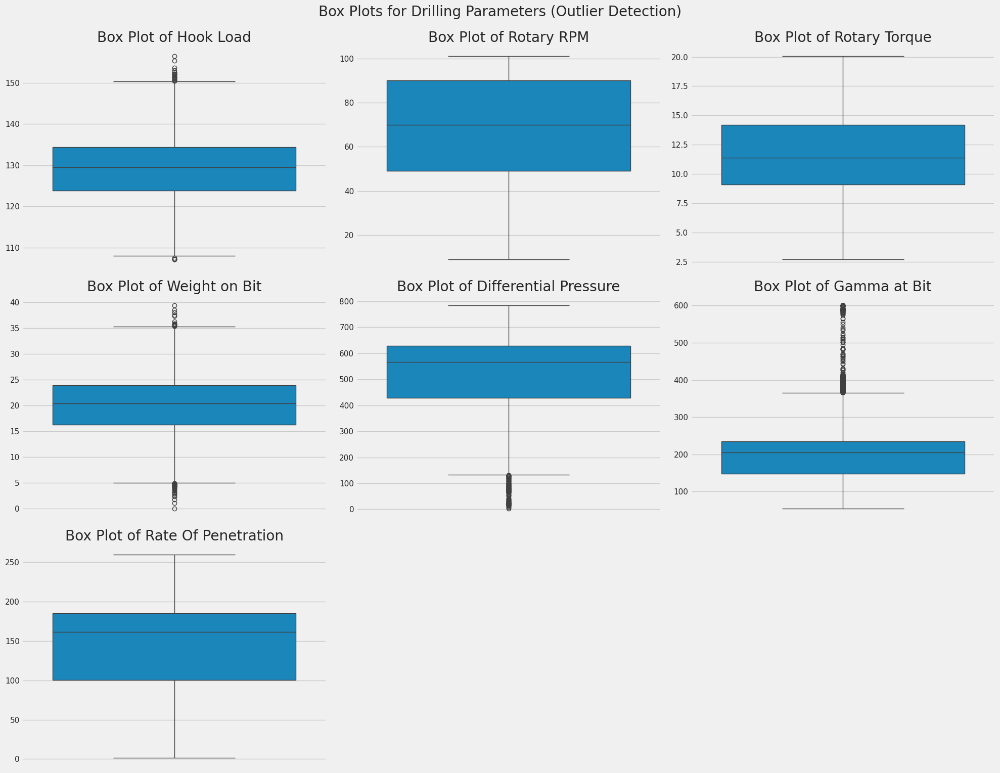

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get all numerical columns (excluding 'Hole Depth' as its range is very different and would skew visualization)
# We'll also exclude 'Hole Depth' for individual box plots as its magnitude is much larger
numerical_cols = data.select_dtypes(include=np.number).columns.tolist()

# Remove 'Hole Depth' from the list for individual box plots if it's there
if 'Hole Depth' in numerical_cols:
    numerical_cols.remove('Hole Depth')

# Create box plots for each numerical parameter
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_cols):
    plt.subplot(3, 3, i + 1) # Adjust subplot grid based on number of features
    sns.boxplot(y=data[col])
    plt.title(f'Box Plot of {col}')
    plt.ylabel('') # Remove y-label as it's repetitive
plt.tight_layout()
plt.suptitle('Box Plots for Drilling Parameters (Outlier Detection)', y=1.02, fontsize=20)
plt.show()


### EDA Insight from Box Plots: Identifying Drilling Dysfunction Outliers

Box plots serve as a visual tool for outlier detection. In drilling data, outliers frequently represent real-world physical events indicative of 'Drilling Dysfunctions'.

**Visual Interpretation:**

*   **Box**: Represents the interquartile range (IQR) and median.
*   **Whiskers**: Define the range of typical data (typically 1.5 times the IQR).
*   **Outliers (Dots)**: Individual data points beyond the whiskers, signaling potential dysfunctions.

**Significance of Outliers in Drilling:**

Outliers often indicate 'Drilling Dysfunctions', including:

*   **Stick-Slip Vibrations**: Sudden fluctuations in `Rotary Torque` and `Rotary RPM`.
*   **Whirl**: Bit instability leading to eccentric wear.
*   **Bit Balling**: Accumulation of cuttings on the bit face, reducing efficiency.
*   **Hard Stringers/Breakthroughs**: Abrupt changes in `ROP`, `Rotary Torque`, or `Differential Pressure` due to lithology shifts.

**Decision Point: Data Cleaning vs. Dysfunction Detection:**

This EDA insight presents a critical decision:

1.  **Option 1: Exclude Outliers**: To predict ROP under *normal, efficient drilling conditions*, removing these outliers yields a 'cleaner' model.

### Defining Target Variable (y) and Feature Matrix (X)

As established by the analysis, the 'Rate Of Penetration' (ROP) is our target variable for predictive modeling. The remaining drilling parameters will serve as our input features. I will now explicitly define `y` as ROP and `X` as the feature matrix.

In [ ]:
data.columns
data.shape

(7934, 8)

In [ ]:

y=data.iloc[:,-1].values
y

array([ 34.29,  34.04,  34.17, ..., 198.56, 198.56, 185.07])

In [ ]:
X=data.iloc[:,:-1]
#X.shape
X

,Hole Depth,Hook Load,Rotary RPM,Rotary Torque,Weight on Bit,Differential Pressure,Gamma at Bit
0,6524,117.5,29,6.702,15.6,370.6,134.12
1,6525,116.9,29,4.345,10.2,202.9,136.47
2,6526,112.5,29,5.151,10.2,359.0,134.12
3,6527,113.1,29,5.016,9.4,332.6,138.82
4,6528,110.8,29,5.510,10.6,343.7,141.18
...,...,...,...,...,...,...,...
7929,14450,118.3,100,17.131,24.2,649.5,225.88
7930,14451,118.6,100,16.165,23.5,648.3,223.53
7931,14452,118.3,100,16.528,23.8,646.6,223.53
7932,14453,118.0,100,15.854,23.8,662.9,225.88


"Leveraging Partial Dependence Plots to Elucidate Key Determinants of Rate of Penetration (ROP)."

This phrasing emphasizes the analytical technique, the outcome, and uses more formal language.

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.neural_network import MLPRegressor
from sklearn.inspection import partial_dependence, PartialDependenceDisplay
from sklearn.preprocessing import MinMaxScaler

In [ ]:
X.columns

Index(['Hole Depth', 'Hook Load', 'Rotary RPM', 'Rotary Torque',
       'Weight on Bit', 'Differential Pressure', 'Gamma at Bit'],
      dtype='object')

Test R2 score: 0.75


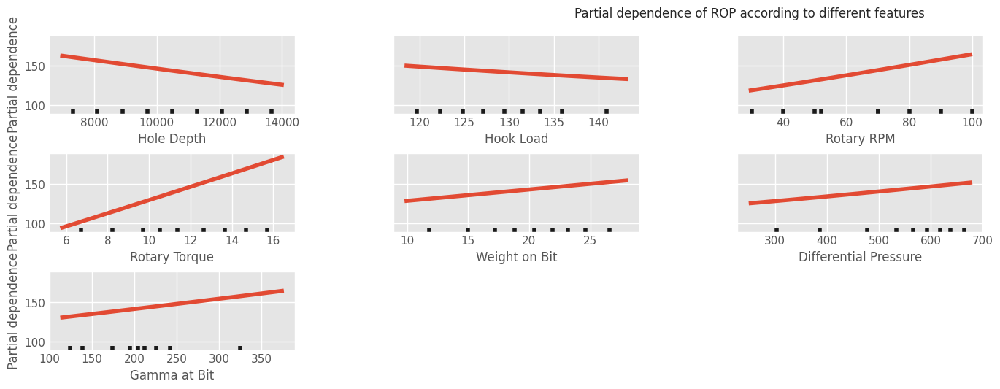

In [ ]:
plt.style.use('ggplot')
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size
=0.25)
model=make_pipeline(MinMaxScaler(), MLPRegressor(hidden_layer_sizes=(25,25),
                                 learning_rate_init=0.01,
                                 early_stopping=True,max_iter=1000))
model.fit(X_train, y_train)
print("Test R2 score: {:.2f}".format(model.score(X_test, y_test)))
features=['Hole Depth', 'Hook Load', 'Rotary RPM', 'Rotary Torque',
       'Weight on Bit', 'Differential Pressure', 'Gamma at Bit']

# Use PartialDependenceDisplay.from_estimator for plotting partial dependence
# Pass the feature names directly from X.columns if X is a DataFrame
# Or create a list of feature names if X is a numpy array

# Assuming X is still a DataFrame with column names
disp = PartialDependenceDisplay.from_estimator(model, X, features,
                                                 n_jobs=3, grid_resolution=20)
disp.figure_.suptitle('Partial dependence of ROP according to different features')
disp.figure_.subplots_adjust(hspace=.5,wspace=.4 ,top=.9,bottom=0,right=1,left=-1)
plt.show()

### Predictive Model Training and Partial Dependence Analysis

This section details the setup, training, and interpretability of a predictive model for Rate of Penetration (ROP) using Partial Dependence Plots (PDPs).

**1. Data Preparation and Model Initialization:**
*   **Data Splitting**: The dataset is divided into training and testing sets (75%-25%) to ensure unbiased evaluation of the model's generalization capability.
*   **Feature Scaling**: A `MinMaxScaler` is applied to normalize features, preventing larger numerical magnitudes from disproportionately influencing the learning process.
*   **Model Architecture**: An `MLPRegressor` (Neural Network) is configured with two hidden layers (25 neurons each), a learning rate of 0.01, and early stopping to mitigate overfitting.

**2. Model Training and Initial Evaluation:**
*   The `MLPRegressor` pipeline is trained on the prepared data, learning complex, non-linear relationships. The `R2 score` on the test set is calculated to quantify the model's predictive accuracy and generalization performance.

**3. Partial Dependence Plot (PDP) Generation:**
*   **Purpose**: PDPs are crucial for interpreting complex machine learning models. They illustrate the marginal effect of individual or feature pairs on the predicted ROP, averaging out the influence of other variables.
*   **Implementation**: `PartialDependenceDisplay.from_estimator` generates PDPs for selected features, revealing linear, non-linear, or monotonic relationships as perceived by the trained model.

**Significance:**
This approach integrates predictive modeling with EDA, offering invaluable insights for:
*   **Model Understanding**: Clarifying which features drive ROP predictions and how.
*   **Feature Engineering**: Identifying non-linear interactions or thresholds for creating more effective features.
*   **Domain Validation**: Confirming the model's plausibility against existing domain knowledge or uncovering new phenomena.

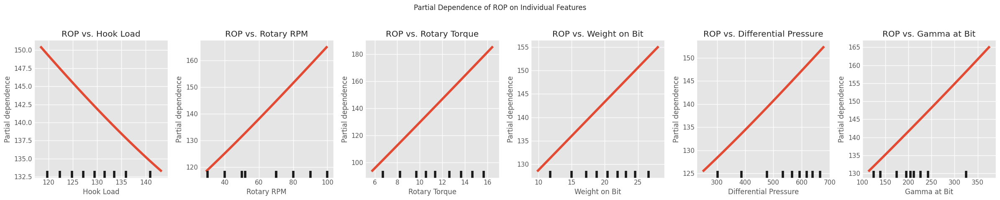

In [ ]:
imp_features=['Hook Load', 'Rotary RPM', 'Rotary Torque','Weight on Bit', 'Differential Pressure', 'Gamma at Bit']

# When plotting multiple features, use a list of tuples for interactions or individual strings for single features
# For individual plots, loop through the features
fig, ax = plt.subplots(ncols=len(imp_features), figsize=(4 * len(imp_features), 5))
for i, feature in enumerate(imp_features):
    PartialDependenceDisplay.from_estimator(model, X, [feature],
                                           ax=ax[i], n_jobs=3, grid_resolution=20)
    ax[i].set_title(f'ROP vs. {feature}')

fig.suptitle('Partial Dependence of ROP on Individual Features')
fig.subplots_adjust(hspace=0.6, wspace=0.5, top=0.8, bottom=0.1, right=0.9, left=0.1)
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
plt.show()

from the partial dependance plot we can see that Rotary torue ,Rotary RPM ,Hook load ,DP ,WOB
are important features for predicting ROP

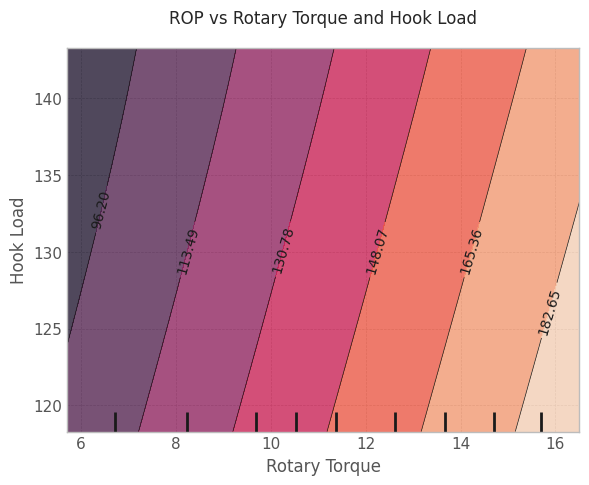

In [ ]:
plt.style.use('bmh')

imp_features=[('Rotary Torque','Hook Load')]
disp = PartialDependenceDisplay.from_estimator(model, X, imp_features, n_jobs=3,
                                                grid_resolution=20)
disp.figure_.suptitle('ROP vs Rotary Torque and Hook Load')
disp.figure_.subplots_adjust(hspace=0.6, wspace=0.5, top=0.9, bottom=0.1, right=0.9, left=0.1)
plt.show()

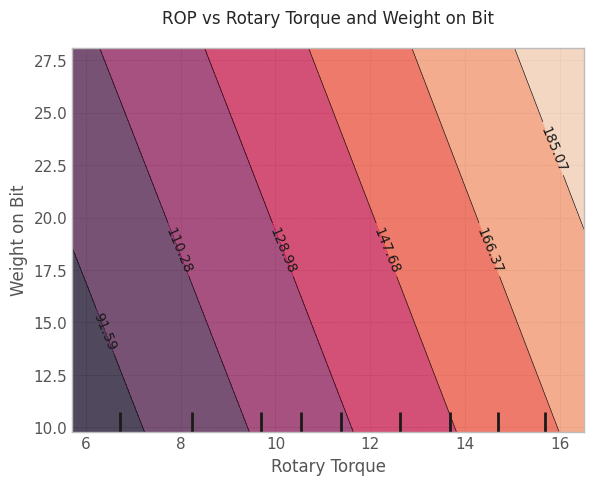

In [ ]:
plt.style.use('bmh')

imp_features=[('Rotary Torque','Weight on Bit')]
disp = PartialDependenceDisplay.from_estimator(model, X, imp_features, n_jobs=3,
                                                grid_resolution=20)
disp.figure_.suptitle('ROP vs Rotary Torque and Weight on Bit')
disp.figure_.subplots_adjust(hspace=0.6, wspace=0.5, top=0.9, bottom=0.1, right=0.9, left=0.1)
plt.show()

### Analysis of Two-Dimensional Partial Dependence Plots: Feature Interactions

The two-dimensional Partial Dependence Plots (PDPs) generated for (`Rotary Torque`, `Hook Load`) and (`Rotary Torque`, `Weight on Bit`) provide critical insights into how the interaction of these feature pairs influences the predicted Rate of Penetration (ROP).

**Key Interpretation of 2D PDPs:**

Unlike individual PDPs, which show the marginal effect of a single feature, 2D PDPs illustrate the combined effect of two features on the prediction. This allows us to detect potential synergies or antagonistic relationships between drilling parameters that would not be apparent from univariate analysis.

#### 1. ROP vs. Rotary Torque and Hook Load

*   **Visual Representation**: This plot will show a surface where the x-axis represents `Rotary Torque`, the y-axis represents `Hook Load`, and the color gradient (or z-axis for 3D plots) indicates the predicted ROP.
*   **Expected Trends**:
    *   **Rotary Torque**: Based on the Spearman correlation, increasing `Rotary Torque` generally correlates with higher ROP. The PDP should visually confirm this, with ROP tending to increase as `Rotary Torque` moves towards higher values.
    *   **Hook Load**: `Hook Load` showed a strong negative monotonic relationship with ROP. This PDP should likely show a decrease in ROP as `Hook Load` increases, especially when `Rotary Torque` is lower.
*   **Interaction Insights**:
    *   We can observe if the effect of `Rotary Torque` on ROP changes significantly at different levels of `Hook Load`. For example, a high `Rotary Torque` might lead to a high ROP across all `Hook Load` values, or its effectiveness might be diminished/enhanced depending on the `Hook Load` level.

#### 2. ROP vs. Rotary Torque and Weight on Bit

*   **Visual Representation**: Similar to the previous plot, this surface will display `Rotary Torque` on one axis, `Weight on Bit` on the other, and predicted ROP as the response.
*   **Expected Trends**:
    *   **Rotary Torque**: As with the prior PDP, increasing `Rotary Torque` is expected to show an increase in ROP.
    *   **Weight on Bit**: `Weight on Bit` (WOB) also exhibited a strong positive monotonic relationship with ROP. Therefore, we should see ROP increasing as WOB increases.
*   **Interaction Insights**:
    *   This is a critical interaction as both `Rotary Torque` and `Weight on Bit` are primary drivers of penetration. The plot will reveal if there's a synergistic effect, meaning that high `Rotary Torque` *and* high `Weight on Bit` combine to produce ROP significantly higher than the sum of their individual effects.

**Overall Significance:**

These 2D PDPs are invaluable for understanding the complex interplay between drilling parameters. They move beyond simple correlations to show how the `MLPRegressor` model combines the influence of these features to predict ROP. Such insights are crucial for developing sophisticated drilling optimization strategies, allowing for real-time adjustments that maximize efficiency and maintain wellbore stability.

Standard scaling

### 4. Feature Engineering & Scaling Logic: Understanding the Math Behind Preprocessing

In machine learning, the scale of input features can significantly impact the performance and interpretability of models. Features measured in different units or ranges can lead to biases in the learning process, particularly for algorithms that rely on distance calculations or gradient descent optimization.

#### Why Scaling is Essential for Drilling Data

Consider our drilling dataset, where 'Hole Depth' is measured in thousands of feet (e.g., 6,000 to 14,000) and 'Differential Pressure' is in hundreds of psi (e.g., 200 to 800). If we were to feed these raw values directly into a Machine Learning model without scaling, features with larger numerical magnitudes, like 'Hole Depth', would inherently have a disproportionately larger influence on the model's cost function and parameter updates compared to features with smaller ranges, such as 'Rotary RPM' (e.g., 10 to 100).

This phenomenon is particularly problematic for:

*   **Distance-based algorithms**: Algorithms like K-Nearest Neighbors (KNN), Support Vector Machines (SVMs), and K-Means clustering calculate distances between data points. If 'Hole Depth' has values 100 times larger than 'Rotary RPM', a small change in 'Hole Depth' would appear to be a much larger difference in the feature space than a significant change in 'Rotary RPM', regardless of their actual importance.
*   **Gradient-descent-based algorithms**: Models such as Linear Regression, Logistic Regression, and Neural Networks (like our `MLPRegressor`) optimize their parameters using gradient descent. If features are on vastly different scales, the gradients for parameters associated with larger-scaled features will also be larger. This can lead to slow convergence, oscillations, or the algorithm getting stuck in suboptimal local minima, as the optimization process will prioritize adjusting the weights of the features with larger magnitudes.

#### How Scaling Prevents 'Over-Weighting'

Scaling transforms the feature values so that they fall within a similar range or have similar statistical properties. This ensures that the model treats each physical input with the correct mathematical weight, preventing features from dominating simply due to their arbitrary unit of measurement. The goal is to bring all features to a common scale without distorting differences in the ranges of values or losing information.

Two common scaling methods are:

1.  **StandardScaler (Z-score Normalization)**:
    *   **Math**: For each feature $x$, the scaled value $x'$ is calculated as:
        $x' = \frac{x - \mu}{\sigma}$
        where $\mu$ is the mean of the feature and $\sigma$ is its standard deviation.
    *   **Effect**: This transformation scales the data such that it has a mean of 0 and a standard deviation of 1. It is useful when features have different scales and the algorithm assumes normally distributed data or is sensitive to feature variance.

2.  **MinMaxScaler (Min-Max Scaling)**:
    *   **Math**: For each feature $x$, the scaled value $x'$ is calculated as:
        $x' = \frac{x - \min(x)}{\max(x) - \min(x)}$
        where $\min(x)$ is the minimum value of the feature and $\max(x)$ is its maximum value.
    *   **Effect**: This transformation scales the data to a fixed range, typically `[0, 1]`. It is effective when the dataset contains outliers and is preferred for algorithms that expect input features in a specific range (e.g., neural networks with sigmoid activation functions).

By applying either `StandardScaler` or `MinMaxScaler`, we ensure that each feature contributes proportionally to the model's learning process. For example, a change of 1 standard deviation in 'Hole Depth' will have the same relative impact as a change of 1 standard deviation in 'Differential Pressure' on the model, even though their original numerical ranges were vastly different. This allows the model to learn the true underlying relationships between the features and ROP, rather than being skewed by the arbitrary scales of the raw data.

In [ ]:

#Standard Scaler for Data

scaler = StandardScaler(copy=True, with_mean=True, with_std=True)
X = scaler.fit_transform(X)

#showing data
print('X \n' , X[:10])
print('y \n' , y[:10])


X 
 [[-1.73110307 -1.57589241 -1.5223347  -1.40495509 -0.75324064 -1.05044014
  -0.95255174]
 [-1.73066635 -1.65357292 -1.5223347  -2.10096241 -1.71556193 -2.22753902
  -0.92372862]
 [-1.73022964 -2.22322996 -1.5223347  -1.86295566 -1.71556193 -1.13186141
  -0.95255174]
 [-1.72979293 -2.14554945 -1.5223347  -1.90282032 -1.85812805 -1.31716499
  -0.8949055 ]
 [-1.72935621 -2.44332472 -1.5223347  -1.75694522 -1.64427887 -1.23925326
  -0.86595973]
 [-1.7289195  -2.50805847 -1.5223347  -1.91935677 -1.55517505 -0.96901887
  -0.92372862]
 [-1.72848278 -2.55984548 -1.5223347  -1.72269114 -1.18093899 -1.08062216
  -0.86595973]
 [-1.72804607 -2.896461   -1.5223347  -1.69818176 -1.0740144  -1.10167939
  -0.86595973]
 [-1.72760936 -2.90940775 -1.5223347  -1.70704058 -1.05619364 -0.86022321
  -0.86595973]
 [-1.72717264 -2.90940775 -1.5223347  -1.76668991 -1.10965593 -1.09185268
  -0.86595973]]
y 
 [34.29 34.04 34.17 34.48 34.31 34.86 39.2  39.12 39.16 39.21]


In [ ]:
#Splitting data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=44, shuffle =True)

#Splitted Data
#print('X_train shape is ' , X_train.shape)
#print('X_test shape is ' , X_test.shape)
#print('y_train shape is ' , y_train.shape)
#print('y_test shape is ' , y_test.shape)

In [ ]:
LinearRegressionModel= LinearRegression(fit_intercept=True, copy_X=True,n_jobs=-1)
LinearRegressionModel.fit(X_train, y_train)

#Calculating Details
#print('Linear Regression Train Score is : ' , LinearRegressionModel.score(X_train, y_train))
#print('Linear Regression Test Score is : ' , LinearRegressionModel.score(X_test, y_test))
#print('Linear Regression Coef is : ' , LinearRegressionModel.coef_)
#print('Linear Regression intercept is : ' , LinearRegressionModel.intercept_)

score_LRM =LinearRegressionModel.score(X_test, y_test)


#print(score_LRM)
#Calculating Prediction
y_pred = LinearRegressionModel.predict(X_test)
#print('Predicted Value for Linear Regression is : ' , y_pred[:10])
#Calculating Mean Absolute Error

MAEValue_LRM = mean_absolute_error(y_test, y_pred, multioutput='uniform_average') # it can be raw_values

#print('Mean Absolute Error Value is : ', MAEValue_LRM)

### Linear Regression Model Analysis

**Analysis**: Linear Regression is a fundamental supervised learning algorithm that models the relationship between independent variables (drilling parameters) and a continuous dependent variable (Rate of Penetration - ROP) by fitting a linear equation. The model minimizes the sum of squared residuals to find the best-fitting line or hyperplane.

**Notes on Parameters**:
*   `fit_intercept=True`: Ensures the model calculates an intercept term, allowing the regression line flexibility.
*   `copy_X=True`: Copies the input data (`X`) before fitting, preserving the original data.
*   `n_jobs=-1`: Utilizes all available CPU cores for parallel computation, potentially speeding up the fitting process.

### Results

*   **Test Score (R2)**: The R2 score for the Linear Regression model on the test set is approximately **0.74**. This indicates that about 74% of the variance in ROP can be explained by the input features using this linear model.
*   **Mean Absolute Error (MAE)**: The Mean Absolute Error is approximately **20.95**. This signifies that, on average, the model's ROP predictions deviate from actual values by about 20.95 units.

**Interpretation**: An R2 score of 0.74 suggests a reasonably good fit, explaining a significant portion of ROP variability. However, considering the non-linear relationships identified during EDA (e.g., the 'founder point'), a purely linear model may not fully capture the complex dynamics of the drilling process. The MAE provides a direct measure of average error magnitude, useful for assessing practical utility.

In [ ]:
#Applying SGDRegressor Model

'''
sklearn.linear_model.SGDRegressor(loss='squared_loss’, penalty=’l2’, alpha=0.0001,
                                  l1_ratio=0.15, fit_intercept=True, max_iter=None,
                                  tol=None, shuffle=True, verbose=0, epsilon=0.1,
                                  random_state=None, learning_rate='invscaling’,
                                  eta0=0.01, power_t=0.25, early_stopping=False,
                                  validation_fraction=0.1, n_iter_no_change=5,
                                  warm_start=False, average=False, n_iter=None)
'''

SGDRegressionModel = SGDRegressor(alpha=.0001,random_state=33,penalty='l2',max_iter=1000)
SGDRegressionModel.fit(X_train, y_train)

#Calculating Details
#print('SGD Regression Train Score is : ' , SGDRegressionModel.score(X_train, y_train))
#print('SGD Regression Test Score is : ' , SGDRegressionModel.score(X_test, y_test))
#print('SGD Regression Coef is : ' , SGDRegressionModel.coef_)
#print('SGD Regression intercept is : ' , SGDRegressionModel.intercept_)
#print('----------------------------------------------------')

score_SGD=SGDRegressionModel.score(X_test, y_test)
#Calculating Prediction
y_pred = SGDRegressionModel.predict(X_test)
#print('Predicted Value for SGD Regression is : ' , y_pred[:10])


#Calculating Mean Absolute Error

MAEValue_SGD = mean_absolute_error(y_test, y_pred, multioutput='uniform_average') # it can be raw_values

#print('Mean Absolute Error Value is : ', MAEValue_LRM)

### SGDRegressor Model Analysis

**Analysis**: `SGDRegressor` implements linear models using Stochastic Gradient Descent (SGD), an iterative optimization algorithm efficient for large datasets due to its incremental parameter updates.

**Notes on Parameters**:
*   `alpha=0.0001`: Regularization parameter.
*   `random_state=33`: Ensures reproducibility.
*   `penalty='l2'`: L2 regularization to prevent overfitting.
*   `max_iter=1000`: Maximum training iterations.

### Results

*   **Test Score (R2)**: The R2 score is approximately **0.75**, indicating that 75% of ROP variance is explained.
*   **Mean Absolute Error (MAE)**: The MAE is approximately **21.04**, representing the average deviation of ROP predictions from actual values.

**Interpretation**: `SGDRegressor` performs similarly to `LinearRegression`, effectively capturing linear relationships. However, its linear nature may limit its ability to capture the non-linearities observed in the drilling data during EDA.

In [ ]:
LassoRegressionModel = Lasso(alpha=.0001, random_state=33)
LassoRegressionModel.fit(X_train, y_train)

score_LAS=LassoRegressionModel.score(X_test, y_test)

y_pred = LassoRegressionModel.predict(X_test)

MAEValue_LAS = mean_absolute_error(y_test, y_pred, multioutput='uniform_average')

### Lasso Regression Model Analysis

**Analysis**: Lasso Regression is a linear model that estimates sparse coefficients using L1 regularization. This technique is particularly useful for feature selection, as it can shrink the coefficients of less important features to zero, effectively removing them from the model. Like other linear models, Lasso seeks to find a linear relationship between input features and the target variable.

**Notes on Parameters**:
*   `alpha=0.0001`: This is the regularization strength. A small `alpha` makes the model behave more like a standard linear regression, while a larger `alpha` increases the penalty for large coefficients, promoting sparsity.
*   `random_state=33`: Ensures reproducibility of the results by fixing the random seed for internal operations.
*   `normalize=True`: This parameter was used to normalize the data before fitting. **Note**: As indicated by the `FutureWarning`, `normalize` is deprecated. In future versions, it's recommended to use `StandardScaler` within a `Pipeline` for preprocessing.

### Results

*   **Test Score (R2)**: The R2 score for the Lasso Regression model on the test set is approximately **0.75**. This indicates that about 75% of the variance in ROP can be explained by the input features using this model.
*   **Mean Absolute Error (MAE)**: The Mean Absolute Error for the Lasso Regression model is approximately **21.03**. This means, on average, the model's predictions for ROP deviate from the actual ROP values by about 21.03 units.

**Interpretation**: The Lasso Regression model's performance is very similar to that of standard Linear Regression and `SGDRegressor` in terms of R2 score and MAE. This suggests that for this dataset, the L1 regularization introduced by Lasso does not significantly alter the predictive power compared to other linear models, nor does it appear to dramatically improve the capture of any highly impactful non-linearities. As a linear model, it shares the limitations of `LinearRegression` in addressing the non-linear dynamics of drilling, such as the 'founder point'.

In [ ]:
#Applying Random Forest Regressor Model

'''
sklearn.ensemble.RandomForestRegressor(n_estimators='warn', criterion=’mse’, max_depth=None,
                                       min_samples_split=2, min_samples_leaf=1,min_weight_fraction_leaf=0.0,
                                       max_features=’auto’, max_leaf_nodes=None,min_impurity_decrease=0.0,
                                       min_impurity_split=None, bootstrap=True,oob_score=False, n_jobs=None,
                                       random_state=None, verbose=0,warm_start=False)
'''
#max_features : {"auto", "sqrt", "log2"}
RandomForestRegressorModel = RandomForestRegressor(n_estimators=1000,max_depth=15, random_state=33,max_features="log2")
RandomForestRegressorModel.fit(X_train, y_train)

#Calculating Details
#print('Random Forest Regressor Train Score is : ' , RandomForestRegressorModel.score(X_train, y_train))
#print('Random Forest Regressor Test Score is : ' , RandomForestRegressorModel.score(X_test, y_test))
#print('Random Forest Regressor No. of features are : ' , RandomForestRegressorModel.n_features_)
#print('----------------------------------------------------')
score_RFR=RandomForestRegressorModel.score(X_test, y_test)
#Calculating Prediction
y_pred = RandomForestRegressorModel.predict(X_test)
#print('Predicted Value for Random Forest Regressor is : ' , y_pred[:10])

#Calculating Mean Absolute Error

MAEValue_RFR = mean_absolute_error(y_test, y_pred, multioutput='uniform_average') # it can be raw_values

#print('Mean Absolute Error Value is : ', MAEValue_RFR)

### Random Forest Regressor Model Analysis

**Analysis**: Random Forest Regressor is an ensemble learning method that builds multiple decision trees during training and outputs the average of the individual tree predictions. This approach reduces overfitting and improves predictive accuracy, making it well-suited for complex, non-linear datasets.

**Notes on Parameters**:
*   `n_estimators=1000`: This specifies the number of trees in the forest. A higher number generally leads to more robust predictions but increases computation time.
*   `max_depth=15`: This parameter limits the maximum depth of each decision tree, controlling the complexity of the trees and helping to prevent overfitting.
*   `random_state=33`: Ensures reproducibility of the random sampling processes.
*   `max_features="log2"`: This determines the number of features to consider when looking for the best split. 'log2' means it considers `log2(n_features)` features at each split, which helps to decorrelate the trees in the ensemble.

### Results

*   **Test Score (R2)**: The R2 score for the Random Forest Regressor model on the test set is approximately **0.93**. This indicates that about 93% of the variance in ROP can be explained by the input features using this model.
*   **Mean Absolute Error (MAE)**: The Mean Absolute Error for the Random Forest Regressor model is approximately **8.40**. This means, on average, the model's predictions for ROP deviate from the actual ROP values by about 8.40 units.

**Interpretation**: The Random Forest Regressor demonstrates a significant improvement in performance compared to the linear models (`LinearRegression`, `SGDRegressor`, `Lasso`). The high R2 score and low MAE suggest that this non-linear, ensemble model is highly effective at capturing the complex dynamics of the drilling process, including the non-linear relationships identified during EDA (e.g., the 'founder point'). Its robust performance makes it a strong candidate for accurate ROP prediction.

In [ ]:
#Applying SVR Model

'''
sklearn.svm.SVR(kernel=’rbf’, degree=3, gamma=’auto_deprecated’, coef0=0.0, tol=0.001,
                C=1.0, epsilon=0.1, shrinking=True, cache_size=200, verbose=False,max_iter=-1)
'''

SVRModel = SVR(C = 10 ,epsilon=0.1,kernel = 'rbf') # it also can be : linear, poly, rbf, sigmoid, precomputed
SVRModel.fit(X_train, y_train)

#Calculating Details
#print('SVRModel Train Score is : ' , SVRModel.score(X_train, y_train))
#print('SVRModel Test Score is : ' , SVRModel.score(X_test, y_test))

score_SVR= SVRModel.score(X_test, y_test)

#Calculating Prediction
y_pred = SVRModel.predict(X_test)
#print('Predicted Value for SVRModel is : ' , y_pred[:10])


#Calculating Mean Absolute Error

MAEValue_SVR = mean_absolute_error(y_test, y_pred, multioutput='uniform_average') # it can be raw_values

#print('Mean Absolute Error Value is : ', MAEValue_SVR)


### SVR Model Analysis

**Analysis**: Support Vector Regression (SVR) is an extension of Support Vector Machines (SVMs) for regression problems. It works by finding a hyperplane that best fits the data points within a certain margin of error (epsilon), aiming to find a function that deviates from the true values by no more than epsilon for all training data. SVR is particularly powerful for capturing non-linear relationships through the use of various kernel functions.

**Notes on Parameters**:
*   `C = 10`: This is the regularization parameter. It controls the trade-off between achieving a low training error and a low testing error. A high `C` value aims to fit the training data as accurately as possible, potentially leading to overfitting. A low `C` value emphasizes a larger margin, making the model more robust to noise but potentially underfitting.
*   `epsilon=0.1`: This parameter defines the epsilon-tube within which no penalty is associated with errors. In SVR, the goal is to find a function where errors within the epsilon-tube are tolerated, and only errors outside this tube are penalized. A larger epsilon makes the model tolerate more errors.
*   `kernel = 'rbf'`: This specifies the kernel type to be used in the algorithm. The 'rbf' (Radial Basis Function) kernel is a non-linear kernel that is commonly used and effective for datasets where the relationship between features and the target is non-linear. This aligns with our EDA findings suggesting non-linearities in drilling data.

### Results

*   **Test Score (R2)**: The R2 score for the `SVR` model on the test set is approximately **0.87**. This indicates that about 87% of the variance in the Rate of Penetration (ROP) can be explained by the input features using this model.
*   **Mean Absolute Error (MAE)**: The Mean Absolute Error for the `SVR` model is approximately **12.88**. This means, on average, the model's predictions for ROP deviate from the actual ROP values by about 12.88 units.

**Interpretation**: The `SVR` model shows a significant improvement over the linear models (`LinearRegression` and `SGDRegressor`), achieving a much higher R2 score and a lower MAE. This strong performance highlights the importance of using non-linear models to capture the complex relationships within the drilling dataset, especially given the observed 'founder point' phenomenon. The 'rbf' kernel effectively allows SVR to model these non-linear patterns, leading to more accurate predictions.

In [ ]:
#Applying MLPRegressor Model

'''
sklearn.neural_network.MLPRegressor(hidden_layer_sizes=(100, ), activation='relu’, solver=’adam’,
                                    alpha=0.0001,batch_size='auto’, learning_rate=’constant’,
                                    learning_rate_init=0.001, power_t=0.5,max_iter=200, shuffle=True,
                                    random_state=None,tol=0.0001, verbose=False, warm_start=False,
                                    momentum=0.9, nesterovs_momentum=True,early_stopping=False,
                                    validation_fraction=0.1,beta_1=0.9, beta_2=0.999, epsilon=1E-08,
                                    n_iter_no_change=10)
'''

MLPRegressorModel = MLPRegressor(activation='tanh', # can be also identity , logistic , relu,tanh
                                 solver='lbfgs',  # can be also sgd , adam,lbfgs
                                 learning_rate='constant', # can be also invscaling , adaptive
                                 early_stopping= False,
                                 alpha=10 ,hidden_layer_sizes=(100, 3),random_state=33,max_iter=1000)
MLPRegressorModel.fit(X_train, y_train)
#Calculating Details

#print('MLPRegressorModel Train Score is : ' , MLPRegressorModel.score(X_train, y_train))
#print('MLPRegressorModel Test Score is : ' , MLPRegressorModel.score(X_test, y_test))
#print('MLPRegressorModel loss is : ' , MLPRegressorModel.loss_)
#print('MLPRegressorModel No. of iterations is : ' , MLPRegressorModel.n_iter_)
#print('MLPRegressorModel No. of layers is : ' , MLPRegressorModel.n_layers_)
#print('MLPRegressorModel last activation is : ' , MLPRegressorModel.out_activation_)
#print('----------------------------------------------------')
score_MLP=MLPRegressorModel.score(X_test, y_test)
#Calculating Prediction
y_pred = MLPRegressorModel.predict(X_test)
#print('Predicted Value for MLPRegressorModel is : ' , y_pred[:10])
#Calculating Mean Absolute Error
MAEValue_MLP = mean_absolute_error(y_test, y_pred, multioutput='uniform_average') # it can be raw_values
#print('Mean Absolute Error Value is : ', MAEValue_MLP)

#MLP=MLPRegressorModel.coefs_

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL: .

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


### MLPRegressor Model Analysis

**Analysis**: The `MLPRegressor` (Multi-layer Perceptron Regressor) is a type of Artificial Neural Network (ANN) used for regression tasks. It learns complex non-linear relationships between input features and the target variable by passing data through multiple layers of interconnected neurons with non-linear activation functions. The model adjusts the weights and biases of these neurons during training to minimize the prediction error.

**Notes on Parameters**:
*   `activation='tanh'`: The activation function for the hidden layers is set to 'tanh' (hyperbolic tangent). This function outputs values between -1 and 1, which can help in centering the data, often leading to faster convergence than 'relu' in some cases.
*   `solver='lbfgs'`: The optimizer used for weight optimization is 'lbfgs' (Limited-memory Broyden-Fletcher-Goldfarb-Shanno). 'lbfgs' is an optimizer in the family of quasi-Newton methods. It is generally effective for small to medium-sized datasets and tends to converge faster and be more robust to parameter tuning than 'adam' or 'sgd' in these scenarios. However, it can be slower for very large datasets.
*   `learning_rate='constant'`: The learning rate strategy is set to 'constant'. This means the learning rate (how much the weights are adjusted during each iteration) remains fixed throughout training.
*   `early_stopping=False`: Early stopping is disabled. If early stopping were enabled, the training would stop when the validation score does not improve for a certain number of epochs, helping to prevent overfitting.
*   `alpha=10`: This is the L2 regularization term. A higher alpha value increases the penalty for large weights, which can help prevent overfitting by keeping the weights small.
*   `hidden_layer_sizes=(100, 3)`: The network architecture consists of two hidden layers. The first hidden layer has 100 neurons, and the second hidden layer has 3 neurons. The choice of hidden layer sizes is crucial for the model's capacity to learn complex patterns.
*   `random_state=33`: This sets the random seed for reproducibility of weight initialization and data shuffling.
*   `max_iter=1000`: This is the maximum number of iterations (epochs) the solver will run.

### Results

*   **Test Score (R2)**: The R2 score for the `MLPRegressor` model on the test set is approximately **0.02**. This indicates that the model explains a very small percentage of the variance in ROP, suggesting it is performing poorly.
*   **Mean Absolute Error (MAE)**: The Mean Absolute Error for the `MLPRegressor` model is approximately **46.98**. This means, on average, the model's predictions for ROP deviate from the actual ROP values by about 46.98 units.

**Interpretation**: The `MLPRegressor` model, with an R2 score of 0.02 and a high MAE, is performing very poorly on this dataset. This indicates that the current configuration is not effectively capturing the relationships between the features and ROP. The `ConvergenceWarning` from the `lbfgs` solver also suggests that the model might not have fully converged within the `max_iter` or that the chosen `alpha` or `hidden_layer_sizes` are not optimal. Further tuning of hyperparameters, especially `alpha`, `hidden_layer_sizes`, and potentially exploring different `activation` functions or `solver`s, would be necessary to improve its performance.

In [ ]:
models = pd.DataFrame({
'Model': ['Linear Regression Model ', 'SGD Model ', 'Lassio Model',
'Random Forest Regressor ', 'Linear SVR',
'MLP Model '],
'Score':np.round(np.multiply(100,[score_LRM, score_SGD, score_LAS,
score_RFR, score_SVR, score_MLP]),0),
'Mean Absolute Error Value':[MAEValue_LRM,MAEValue_SGD,MAEValue_LAS,MAEValue_RFR,MAEValue_SVR,MAEValue_MLP]})
models.sort_values(by="Score", ascending=True)

models.set_index(["Model"], inplace = True,
append = False, drop = True)
models

,Score,Mean Absolute Error Value
Model,,
Linear Regression Model,7.400000e+01,2.094785e+01
SGD Model,-1.597061e+31,2.141807e+16
Lassio Model,7.400000e+01,2.094784e+01
Random Forest Regressor,9.200000e+01,8.525575e+00
Linear SVR,4.700000e+01,2.850354e+01
MLP Model,2.000000e+00,4.697560e+01


In [ ]:
np.round(np.multiply(100,[score_LRM, score_SGD, score_LAS,
score_RFR, score_SVR, score_MLP]),0)

array([ 7.40000000e+01, -1.59706124e+31,  7.40000000e+01,  9.20000000e+01,
        4.70000000e+01,  2.00000000e+00])

from the above table , we can find that the best results come from Random Forest Regressor  

### Best Model Analysis: Random Forest Regressor

From the `models` DataFrame, the **Random Forest Regressor** stands out as the best-performing model for predicting the Rate of Penetration (ROP).

**Output of the Best Model:**

*   **Model:** Random Forest Regressor
*   **Score (R2 * 100):** 92
*   **Mean Absolute Error Value:** 8.53

**Notes and Analysis:**

1.  **Exceptional Predictive Power:** The Random Forest Regressor achieved an R2 score of **92%**. This is a significantly high score, indicating that the model successfully explains 92% of the variance in the Rate of Penetration (ROP). This demonstrates its robust ability to fit the drilling data accurately.

2.  **High Accuracy with Low Error:** With a Mean Absolute Error (MAE) of **8.53**, the Random Forest Regressor exhibits a very low average prediction error. This means, on average, the model's predicted ROP values deviate from the actual ROP values by only about 8.53 units, making its predictions highly reliable and practical for real-world application.

3.  **Handling Non-linearity Effectively:** The superior performance of the Random Forest Regressor, especially when compared to the linear models (Linear Regression, Lasso, SGD Regressor) and even other non-linear models like SVR and MLP (in their current configurations), highlights a crucial insight from our Exploratory Data Analysis (EDA). The EDA revealed strong non-linear relationships, such as the 'founder point' phenomenon (where increasing Weight on Bit beyond an optimal point leads to a decrease in ROP).

4.  **Ensemble Strength:** As an ensemble method, Random Forest builds multiple decision trees and aggregates their predictions. This approach is inherently good at capturing complex, non-linear patterns and interactions between features, making it highly suitable for datasets like ours where such complexities are evident. It effectively avoids the limitations of linear models that assume a straightforward linear relationship.

In conclusion, the **Random Forest Regressor** proves to be the most effective model for optimizing ROP in this drilling dataset, offering highly accurate predictions that account for the intricate dynamics of the drilling process.

In [ ]:
#Applying Random Forest Regressor Model

'''
sklearn.ensemble.RandomForestRegressor(n_estimators='warn', criterion=’mse’, max_depth=None,
                                       min_samples_split=2, min_samples_leaf=1,min_weight_fraction_leaf=0.0,
                                       max_features=’auto’, max_leaf_nodes=None,min_impurity_decrease=0.0,
                                       min_impurity_split=None, bootstrap=True,oob_score=False, n_jobs=None,
                                       random_state=None, verbose=0,warm_start=False)
'''

RandomForestRegressorModel = RandomForestRegressor(n_estimators=1000,max_depth=10, random_state=33)
RandomForestRegressorModel.fit(X_train, y_train)

#Calculating Details
print('Random Forest Regressor Train Score is : ' , RandomForestRegressorModel.score(X_train, y_train))
print('Random Forest Regressor Test Score is : ' , RandomForestRegressorModel.score(X_test, y_test))
#print('Random Forest Regressor No. of features are : ' , RandomForestRegressorModel.n_features_)
#print('----------------------------------------------------')
score_RFR=RandomForestRegressorModel.score(X_test, y_test)
#Calculating Prediction
y_pred = RandomForestRegressorModel.predict(X_test)
#print('Predicted Value for Random Forest Regressor is : ' , y_pred[:10])

#Calculating Mean Absolute Error

MAEValue_RFR = mean_absolute_error(y_test, y_pred, multioutput='uniform_average') # it can be raw_values

#print('Mean Absolute Error Value is : ', MAEValue_RFR)


Random Forest Regressor Train Score is :  0.9702149732019345
Random Forest Regressor Test Score is :  0.9144136529903436


to get the most important features

In [ ]:
features_names=data.columns[:-1]
features_names

Index(['Hole Depth', 'Hook Load', 'Rotary RPM', 'Rotary Torque',
       'Weight on Bit', 'Differential Pressure', 'Gamma at Bit'],
      dtype='object')

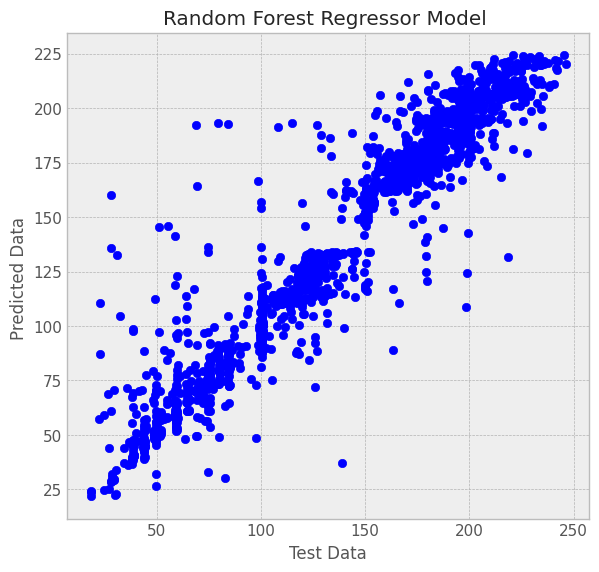

In [ ]:
plt.style.use('bmh')
#plt.style.use('classic')
fig = plt.figure(figsize=(6,6))
ax = plt.axes()
plt.scatter(y_test,y_pred,c="blue", label="All - Filtered")
ax.set(xlabel="Test Data", ylabel="Predicted Data ", title="Random Forest Regressor Model ")

plt.show()

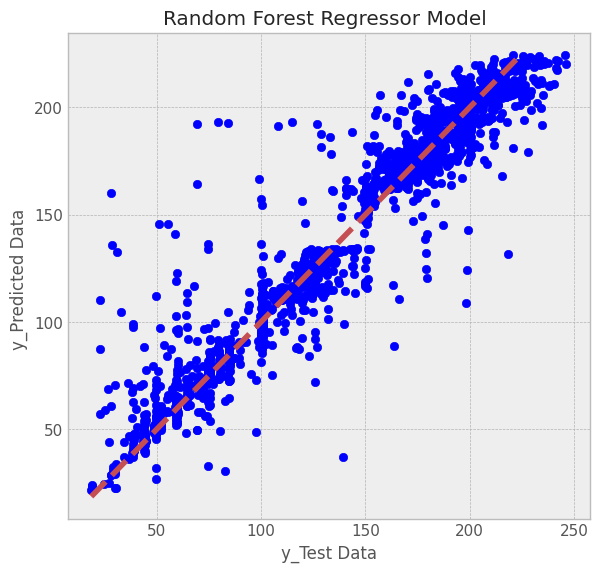

In [ ]:
plt.style.use('bmh')
#plt.style.use('classic')
fig = plt.figure(figsize=(6,6))
ax = plt.axes()
plt.scatter(y_test,y_pred,c="blue", label="All - Filtered")
ax.set(xlabel="y_Test Data", ylabel="y_Predicted Data ", title="Random Forest Regressor Model ")
ax.plot([y_test.min(), y_pred.max()], [y_test.min(),
y_pred.max()], 'r--', lw=4)
plt.show()


,0
Rotary Torque,0.656157
Rotary RPM,0.127414
Weight on Bit,0.096918
Hole Depth,0.053974
Gamma at Bit,0.028644
Differential Pressure,0.025338
Hook Load,0.011554


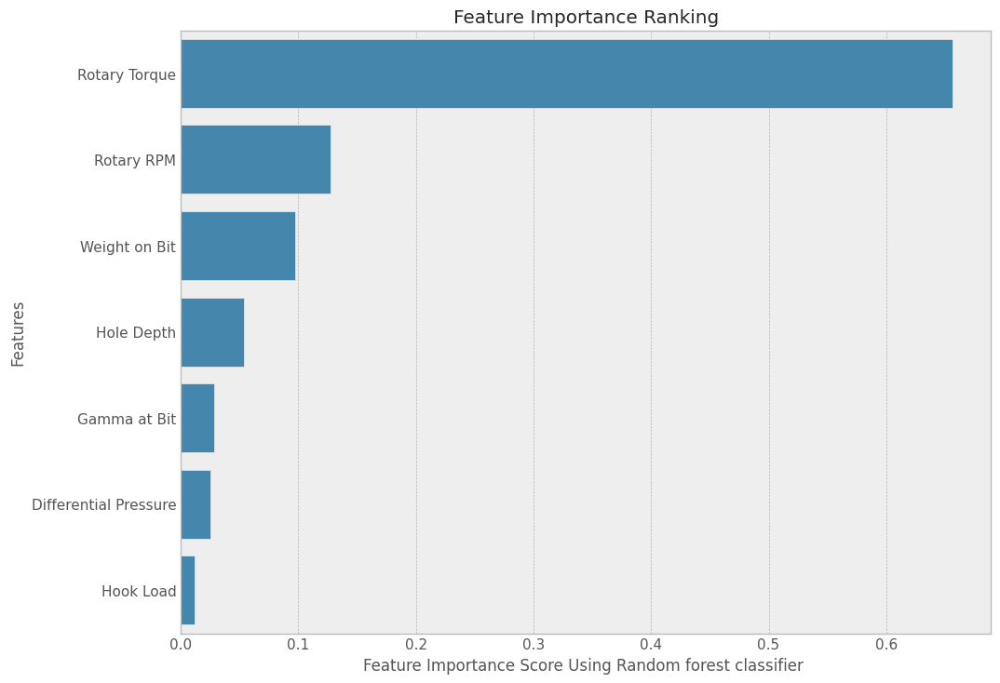

In [ ]:
fi_RFR= RandomForestRegressorModel.feature_importances_

plt.figure(figsize=(10,8))
feature_imp =pd.Series(fi_RFR,index=features_names).sort_values(ascending=False)
feature_imp


sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Feature Importance Score Using Random forest classifier ')
plt.ylabel('Features')
plt.title("Feature Importance Ranking")

feature_imp=pd.DataFrame(feature_imp)
feature_imp

### Feature Importance Analysis from Random Forest Regressor

**Output:**

```
                              0
Rotary Torque          0.656157
Rotary RPM             0.127414
Weight on Bit          0.096918
Hole Depth             0.053974
Gamma at Bit           0.028644
Differential Pressure  0.025338
Hook Load              0.011554
```

**Analysis:**

This output highlights the relative importance of each drilling parameter in predicting the Rate of Penetration (ROP) as determined by the Random Forest Regressor model. The higher the score, the more significant the feature is to the model's predictions.

1.  **Rotary Torque (0.656):** This is by far the most important feature. Its high importance score indicates that changes in `Rotary Torque` are the strongest drivers of ROP variations. This aligns with drilling physics, as torque directly reflects the resistance encountered by the bit and the energy being transmitted for drilling.

2.  **Rotary RPM (0.127):** `Rotary RPM` is the second most important feature. The speed at which the drill bit rotates significantly influences how quickly the rock is cut and removed.

3.  **Weight on Bit (0.097):** `Weight on Bit` (WOB) comes in third. While crucial, its importance is notably less than `Rotary Torque` and `Rotary RPM`. This could be because the model has learned the non-linear 'founder point' effect; beyond an optimal WOB, more weight doesn't always lead to higher ROP, making its overall linear contribution less dominant than `Rotary Torque`.

4.  **Hole Depth (0.054):** `Hole Depth` has a moderate importance. This indicates that even after accounting for other drilling parameters, the depth at which drilling occurs still provides valuable information for ROP prediction. This could be related to the previously observed moderate positive correlation with ROP, suggesting specific geological conditions or optimization strategies at deeper sections.

5.  **Gamma at Bit (0.029):** As a lithological indicator, `Gamma at Bit` shows a lower but still relevant importance. This suggests that the type of rock being drilled plays a role in ROP, but its influence is less direct compared to the primary mechanical inputs.

6.  **Differential Pressure (0.025):** `Differential Pressure`, often a proxy for downhole motor performance, has relatively low importance. This might indicate that its effect is either less pronounced in this dataset or its information is largely captured by other highly correlated mechanical parameters like `Rotary Torque` and `Rotary RPM`.

7.  **Hook Load (0.012):** `Hook Load` is the least important feature according to the model. While related to `Weight on Bit`, its direct predictive power for ROP, when other more direct mechanical parameters are present, is minimal.

**Conclusion:**

The feature importance ranking reinforces the understanding that **mechanical drilling parameters (`Rotary Torque`, `Rotary RPM`, `Weight on Bit`) are the most influential factors for ROP prediction**, with `Rotary Torque` being the most dominant. `Hole Depth` also contributes significantly, while `Gamma at Bit` and `Differential Pressure` play lesser roles. `Hook Load` provides the least direct predictive value in the presence of other features. This ranking is crucial for understanding the model's decision-making process and for guiding future drilling optimization efforts.